<br>
# Tensorflow DCGAN

### Load packages

In [1]:
import os
import time
import tensorflow as tf
import numpy as np
from glob import glob
import datetime
import random
import PIL
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tqdm
%matplotlib inline
import urllib
import tarfile
import xml.etree.ElementTree as ET
from imageio import imread, imsave, mimsave
import shutil
import cv2
import glob
from imageio import imread, imsave, mimsave

# Load and Crop Data



- [Crop images using bounding box](https://www.kaggle.com/whizzkid/crop-images-using-bounding-box)
- [Dog Memorizer GAN](https://www.kaggle.com/cdeotte/dog-memorizer-gan)

In [2]:
!ls ../input/

all-dogs  annotation


In [3]:
root_images = "../input/generative-dog-images/all-dogs/all-dogs/"
root_annots = "../input/generative-dog-images/annotation/Annotation/"
INPUT_DATA_DIR = "../input/generative-dog-images/all-dogs/all-dogs/"
IMG_DIR = "images"
ComputeLB = False
DogsOnly = True

**Processing**

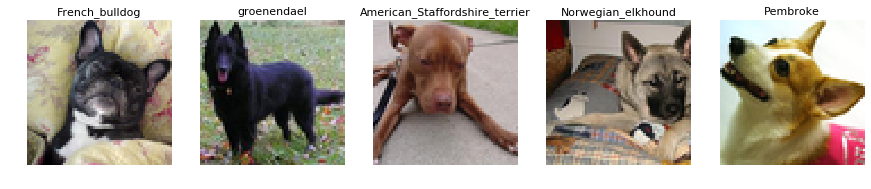

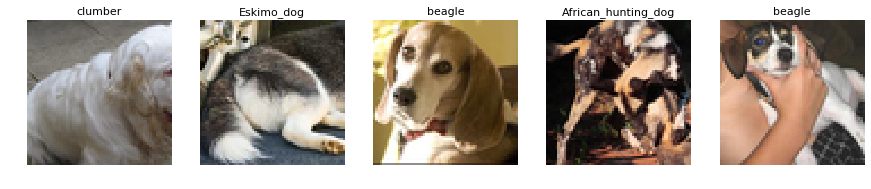

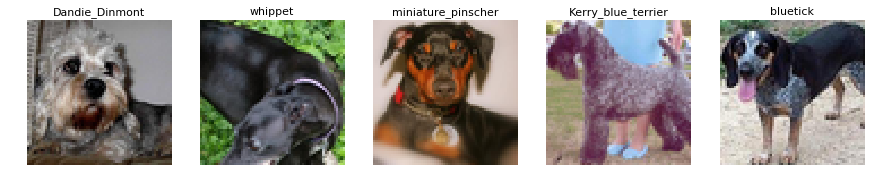

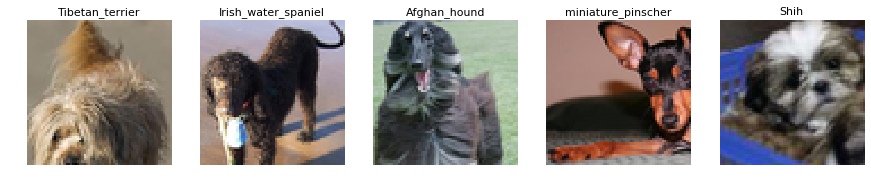

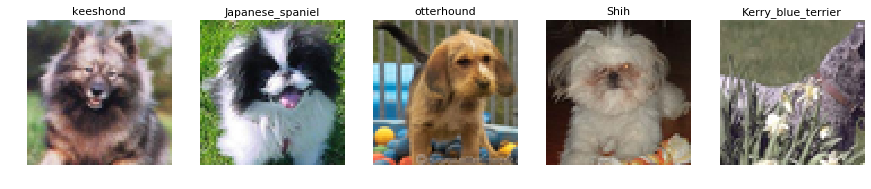

In [4]:
import numpy as np, pandas as pd, os
import xml.etree.ElementTree as ET 
import matplotlib.pyplot as plt, zipfile 
from PIL import Image 
from glob import glob

ROOT = '../input/generative-dog-images/'
if not ComputeLB: ROOT = '../input/'
IMAGES = os.listdir(ROOT + 'all-dogs/all-dogs/')
breeds = os.listdir(ROOT + 'annotation/Annotation/') 

idxIn = 0; namesIn = []
imagesIn = np.zeros((25000,64,64,3))

# CROP WITH BOUNDING BOXES TO GET DOGS ONLY
# https://www.kaggle.com/paulorzp/show-annotations-and-breeds
if DogsOnly:
    for breed in breeds:
        for dog in os.listdir(ROOT+'annotation/Annotation/'+breed):
            try: img = Image.open(ROOT+'all-dogs/all-dogs/'+dog+'.jpg') 
            except: continue           
            tree = ET.parse(ROOT+'annotation/Annotation/'+breed+'/'+dog)
            root = tree.getroot()
            objects = root.findall('object')
            for o in objects:
                bndbox = o.find('bndbox') 
                xmin = int(bndbox.find('xmin').text)
                ymin = int(bndbox.find('ymin').text)
                xmax = int(bndbox.find('xmax').text)
                ymax = int(bndbox.find('ymax').text)
                w = np.min((xmax - xmin, ymax - ymin))
                img2 = img.crop((xmin, ymin, xmin+w, ymin+w))
                img2 = img2.resize((64,64), Image.ANTIALIAS)
                imagesIn[idxIn,:,:,:] = np.asarray(img2)
                #if idxIn%1000==0: print(idxIn)
                namesIn.append(breed)
                idxIn += 1
    idx = np.arange(idxIn)
    np.random.shuffle(idx)
    imagesIn = imagesIn[idx,:,:,:]
    namesIn = np.array(namesIn)[idx]
    
# RANDOMLY CROP FULL IMAGES
else:
    x = np.random.choice(np.arange(20579),10000)
    for k in range(len(x)):
        img = Image.open(ROOT + 'all-dogs/all-dogs/' + IMAGES[x[k]])
        w = img.size[0]
        h = img.size[1]
        sz = np.min((w,h))
        a=0; b=0
        if w<h: b = (h-sz)//2
        else: a = (w-sz)//2
        img = img.crop((0+a, 0+b, sz+a, sz+b))  
        img = img.resize((64,64), Image.ANTIALIAS)   
        imagesIn[idxIn,:,:,:] = np.asarray(img)
        namesIn.append(IMAGES[x[k]])
        if idxIn%1000==0: print(idxIn)
        idxIn += 1
    
# DISPLAY CROPPED IMAGES
x = np.random.randint(0,idxIn,25)
for k in range(5):
    plt.figure(figsize=(15,3))
    for j in range(5):
        plt.subplot(1,5,j+1)
        img = Image.fromarray( imagesIn[x[k*5+j],:,:,:].astype('uint8') )
        plt.axis('off')
        if not DogsOnly: plt.title(namesIn[x[k*5+j]],fontsize=11)
        else: plt.title(namesIn[x[k*5+j]].split('-')[1],fontsize=11)
        plt.imshow(img)
    plt.show()

In [5]:
imagesIn.shape

(22125, 64, 64, 3)

<br>
# Generator

The original **Generator** (from the Paper) was:

```100x1 → 1024x4x4 → 512x8x8 → 256x16x16 → 128x32x32 → 64x64x3```
![](https://cdn-images-1.medium.com/max/800/1*rdXKdyfNjorzP10ZA3yNmQ.png)

My version is:

```.... → 512x4x4 → 256x8x8 → 128x16x16 → 64x32x32 → 64x64x32 → 64x64x32```

In [6]:
def generator(z, output_channel_dim, training):
    with tf.variable_scope("generator", reuse= not training):
        
        # 4x4x512
        fully_connected = tf.layers.dense(z, 4*4*512)
        fully_connected = tf.reshape(fully_connected, (-1, 4, 4, 512))
        fully_connected = tf.nn.leaky_relu(fully_connected)

        # 4x4x512 -> 8x8x256
        trans_conv1 = tf.layers.conv2d_transpose(inputs=fully_connected,
                                                 filters=256,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv1")
        batch_trans_conv1 = tf.layers.batch_normalization(inputs = trans_conv1,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv1")
        trans_conv1_out = tf.nn.leaky_relu(batch_trans_conv1,
                                           name="trans_conv1_out")
        
        # 8x8x256 -> 16x16x128
        trans_conv2 = tf.layers.conv2d_transpose(inputs=trans_conv1_out,
                                                 filters=128,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv2")
        batch_trans_conv2 = tf.layers.batch_normalization(inputs = trans_conv2,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv2")
        trans_conv2_out = tf.nn.leaky_relu(batch_trans_conv2,
                                           name="trans_conv2_out")
        
        # 16x16x128 -> 32x32x64
        trans_conv3 = tf.layers.conv2d_transpose(inputs=trans_conv2_out,
                                                 filters=64,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv3")
        batch_trans_conv3 = tf.layers.batch_normalization(inputs = trans_conv3,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv3")
        trans_conv3_out = tf.nn.leaky_relu(batch_trans_conv3,
                                           name="trans_conv3_out")
        

        # 32x32x64 -> 64x64x32
        trans_conv4 = tf.layers.conv2d_transpose(inputs=trans_conv3_out,
                                                 filters=32,
                                                 kernel_size=[5,5],
                                                 strides=[2,2],
                                                 padding="SAME",
                                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                                 name="trans_conv4")
        batch_trans_conv4 = tf.layers.batch_normalization(inputs = trans_conv4,
                                                          training=training,
                                                          epsilon=EPSILON,
                                                          name="batch_trans_conv4")
        trans_conv4_out = tf.nn.leaky_relu(batch_trans_conv4,
                                           name="trans_conv4_out")
        
        # 64x64x32 -> 64x64x3
        logits = tf.layers.conv2d_transpose(inputs=trans_conv4_out,
                                            filters=3,
                                            kernel_size=[5,5],
                                            strides=[1,1],
                                            padding="SAME",
                                            kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                            name="logits")
        out = tf.tanh(logits, name="out")
        return out

# Discriminator

In [7]:
def discriminator(x, reuse):
    with tf.variable_scope("discriminator", reuse=reuse): 
        
        # 64x64x3 -> 32x32x32
        conv1 = tf.layers.conv2d(inputs=x,
                                 filters=32,
                                 kernel_size=[5,5],
                                 strides=[2,2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv1')
        batch_norm1 = tf.layers.batch_normalization(conv1,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm1')
        conv1_out = tf.nn.leaky_relu(batch_norm1,
                                     name="conv1_out")
        
        # 32x32x32 -> 16x16x64
        conv2 = tf.layers.conv2d(inputs=conv1_out,
                                 filters=64,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv2')
        batch_norm2 = tf.layers.batch_normalization(conv2,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm2')
        conv2_out = tf.nn.leaky_relu(batch_norm2,
                                     name="conv2_out")
        
        # 16x16x64 -> 8x8x128
        conv3 = tf.layers.conv2d(inputs=conv2_out,
                                 filters=128,
                                 kernel_size=[5, 5],
                                 strides=[2, 2],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv3')
        batch_norm3 = tf.layers.batch_normalization(conv3,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm3')
        conv3_out = tf.nn.leaky_relu(batch_norm3,
                                     name="conv3_out")
        
        # 8x8x128 -> 8x8x256
        conv4 = tf.layers.conv2d(inputs=conv3_out,
                                 filters=256,
                                 kernel_size=[5, 5],
                                 strides=[1, 1],
                                 padding="SAME",
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='conv4')
        batch_norm4 = tf.layers.batch_normalization(conv4,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm4')
        conv4_out = tf.nn.leaky_relu(batch_norm4,
                                     name="conv4_out")
        
        # 8x8x256 -> 4x4x512
        
        conv5 = tf.layers.conv2d(inputs=conv4_out,
                                filters=512,
                                kernel_size=[5, 5],
                                strides=[2, 2],
                                padding="SAME",
                                kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                name='conv5')
        batch_norm5 = tf.layers.batch_normalization(conv5,
                                                    training=True,
                                                    epsilon=EPSILON,
                                                    name='batch_norm5')
        conv5_out = tf.nn.leaky_relu(batch_norm5,
                                     name="conv5_out")

        flatten = tf.reshape(conv5_out, (-1, 4*4*512))
        logits = tf.layers.dense(inputs=flatten,
                                 units=1,
                                 activation=None)
        out = tf.sigmoid(logits)
        return out, logits

# Loss and Optimizer

In [8]:
def model_loss(input_real, input_z, output_channel_dim):
    g_model = generator(input_z, output_channel_dim, True)

    noisy_input_real = input_real + tf.random_normal(shape=tf.shape(input_real),
                                                     mean=0.0,
                                                     stddev=random.uniform(0.0, 0.1),
                                                     dtype=tf.float32)
    
    d_model_real, d_logits_real = discriminator(noisy_input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                                         labels=tf.ones_like(d_model_real)*random.uniform(0.9, 1.0)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                         labels=tf.zeros_like(d_model_fake)))
    d_loss = tf.reduce_mean(0.5 * (d_loss_real + d_loss_fake))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                                    labels=tf.ones_like(d_model_fake)))
    return d_loss, g_loss

In [9]:
def model_optimizers(d_loss, g_loss):
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith("generator")]
    d_vars = [var for var in t_vars if var.name.startswith("discriminator")]
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    gen_updates = [op for op in update_ops if op.name.startswith('generator')]
    
    with tf.control_dependencies(gen_updates):
        d_train_opt = tf.train.AdamOptimizer(learning_rate=LR_D, beta1=BETA1_D).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate=LR_G, beta1=BETA1_G).minimize(g_loss, var_list=g_vars)  
    return d_train_opt, g_train_opt

In [10]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='inputs_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name="input_z")
    learning_rate_G = tf.placeholder(tf.float32, name="lr_g")
    learning_rate_D = tf.placeholder(tf.float32, name="lr_d")
    return inputs_real, inputs_z, learning_rate_G, learning_rate_D

# Utils

In [11]:
def show_samples(sample_images, name, epoch):
    figure, axes = plt.subplots(1, len(sample_images), figsize = (IMAGE_SIZE, IMAGE_SIZE))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample_images[index].astype('uint8') 
        axis.imshow(image_array)
    plt.show()
    plt.close()

In [12]:
def save_samples(sample_images, name, epoch):
    # save images
    for index,img in enumerate(sample_images):
        image = Image.fromarray(img.astype('uint8') )
        image.save(name+"_"+str(epoch)+"_"+str(index)+".png") 

In [13]:
def test(sess, input_z, out_channel_dim, epoch):
    example_z = np.random.uniform(-1, 1, size=[SAMPLES_TO_SHOW, input_z.get_shape().as_list()[-1]])
    samples = sess.run(generator(input_z, out_channel_dim, False), feed_dict={input_z: example_z})
    sample_images = [((sample + 1.0) * 127.5).astype(np.uint8) for sample in samples]
    show_samples(sample_images, IMG_DIR + "samples", epoch)

In [14]:
def generate (sess, input_z, out_channel_dim):
    print (">> Generating 1k images ...")
    for i in tqdm(range(100)):
        example_z = np.random.uniform(-1, 1, size=[100, 100]).astype(np.float32)
        imgs = sess.run(generator(input_z, out_channel_dim, False), feed_dict={input_z: example_z})
        imgs = [((img + 1.0) * 127.5).astype(np.uint8) for img in imgs]
        for j in range(len(imgs)):
            imsave(os.path.join(IMG_DIR, f'dog_{i}_{j}.png'), imgs[j])

In [15]:
def summarize_epoch(epoch, duration, sess, d_losses, g_losses, input_z, data_shape):
    minibatch_size = int(data_shape[0]//BATCH_SIZE)
    print("Epoch {}/{}".format(epoch, EPOCHS),
          "\nDuration: {:.5f}".format(duration),
          "\nD Loss: {:.5f}".format(np.mean(d_losses[-minibatch_size:])),
          "\nG Loss: {:.5f}".format(np.mean(g_losses[-minibatch_size:])))
    
    fig, ax = plt.subplots()
    plt.plot(d_losses, label='Discriminator', alpha=0.6)
    plt.plot(g_losses, label='Generator', alpha=0.6)
    plt.title("Losses")
    plt.legend()
    #plt.savefig(OUTPUT_DIR + "losses_" + str(epoch) + ".png")
    plt.show()
    plt.close()
    test(sess, input_z, data_shape[3], epoch)

In [16]:
def get_batches(data):
    batches = []
    for i in range(int(data.shape[0]//BATCH_SIZE)):
        batch = data[i * BATCH_SIZE:(i + 1) * BATCH_SIZE]
        augmented_images = []
        for img in batch:
            image = Image.fromarray(img.astype('uint8'))
            if random.choice([True, False]):
                image = image.transpose(Image.FLIP_LEFT_RIGHT)
            augmented_images.append(np.asarray(image))
        batch = np.asarray(augmented_images)
        normalized_batch = (batch / 127.5) - 1.0
        batches.append(normalized_batch)
    return batches

<br>
# Training

In [17]:
!mkdir images
!ls

__notebook__.ipynb  __output__.json  images


In [18]:
def train(get_batches, data_shape, LR_G = 2e-4, LR_D = 0.0005):
    input_images, input_z, lr_G, lr_D = model_inputs(data_shape[1:], NOISE_SIZE)
    d_loss, g_loss = model_loss(input_images, input_z, data_shape[3])
    d_opt, g_opt = model_optimizers(d_loss, g_loss)
    generator_epoch_loss = 0
    train_d_losses = []
    train_g_losses = []
    generator_epoch_loss = 999
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        epoch = 0
        iteration = 0
        d_losses = []
        g_losses = []
        
        for epoch in tqdm(range(EPOCHS)):        
            epoch += 1
            start_time = time.time()
                
            for batch_images in get_batches:
                iteration += 1
                batch_z = np.random.uniform(-1, 1, size=(BATCH_SIZE, NOISE_SIZE))
                _ = sess.run(d_opt, feed_dict={input_images: batch_images, input_z: batch_z, lr_D: LR_D})
                _ = sess.run(g_opt, feed_dict={input_images: batch_images, input_z: batch_z, lr_G: LR_G})
                d_losses.append(d_loss.eval({input_z: batch_z, input_images: batch_images}))
                g_losses.append(g_loss.eval({input_z: batch_z}))

            summarize_epoch(epoch, time.time()-start_time, sess, d_losses, g_losses, input_z, data_shape)
            minibatch_size = int(data_shape[0]//BATCH_SIZE)
            generator_epoch_loss = np.mean(g_losses[-minibatch_size:])
            train_d_losses.append(np.mean(d_losses[-minibatch_size:]))
            train_g_losses.append(np.mean(g_losses[-minibatch_size:]))
            
            if epoch == EPOCHS:
                generate (sess, input_z, out_channel_dim=3)
            
    fig, ax = plt.subplots()
    plt.plot(train_d_losses, label='Discriminator', alpha=0.5)
    plt.plot(train_g_losses, label='Generator', alpha=0.5)
    plt.title("Training Losses")
    plt.legend()
    plt.savefig('train_losses.png')
    plt.show()
    plt.close()

**Hyperparameters**

In [19]:
IMAGE_SIZE = 64
NOISE_SIZE = 100
LR_D = 0.0005
LR_G = 2e-4
BATCH_SIZE = 64
EPOCHS = 100
BETA1_G = 0.5
BETA1_D = 0.5
WEIGHT_INIT_STDDEV = 0.02
MOMENTUM = 0.9
EPSILON = 0.0005
SAMPLES_TO_SHOW = 5 # each epoch

**Training loop**

>> Start training...


Epoch 1/100 
Duration: 41.53835 
D Loss: 0.63453 
G Loss: 1.93595


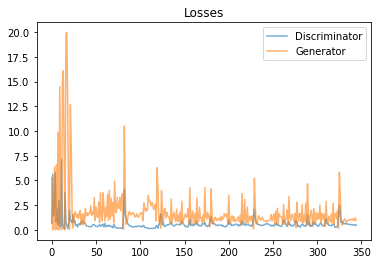

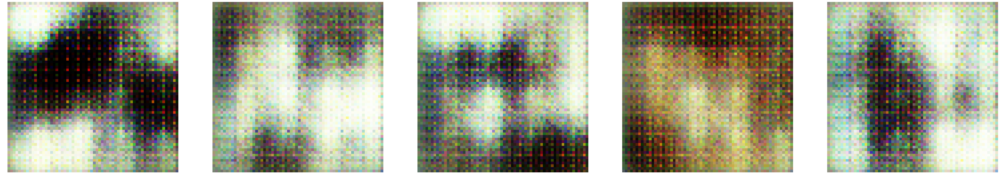

Epoch 2/100 
Duration: 37.45887 
D Loss: 0.53195 
G Loss: 1.51548


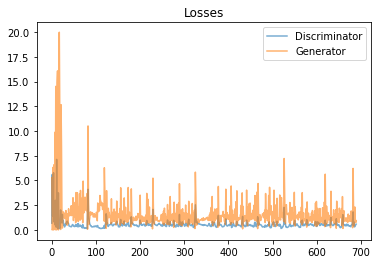

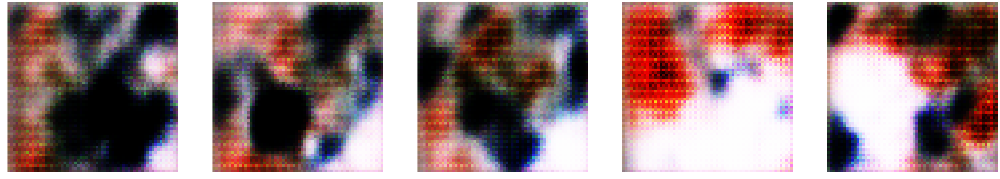

Epoch 3/100 
Duration: 36.91591 
D Loss: 0.58605 
G Loss: 1.22149


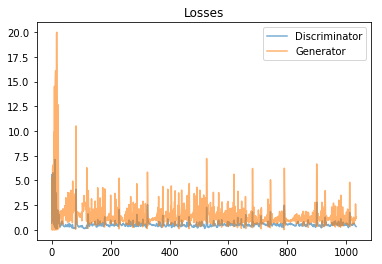

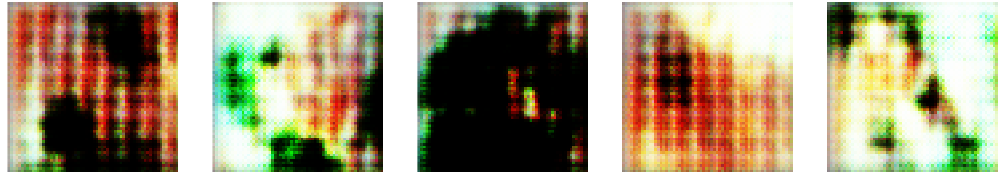

Epoch 4/100 
Duration: 37.25119 
D Loss: 0.56844 
G Loss: 1.21302


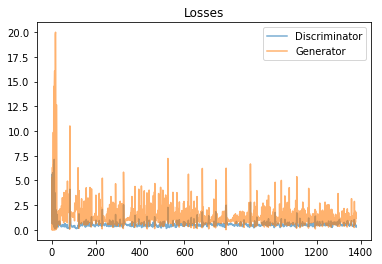

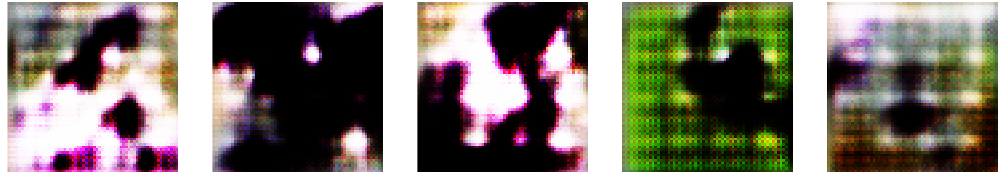

Epoch 5/100 
Duration: 36.94963 
D Loss: 0.58209 
G Loss: 1.11905


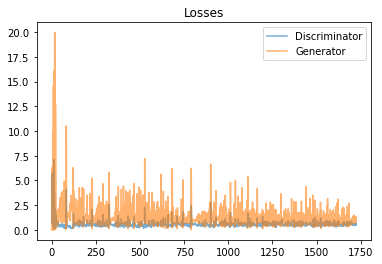

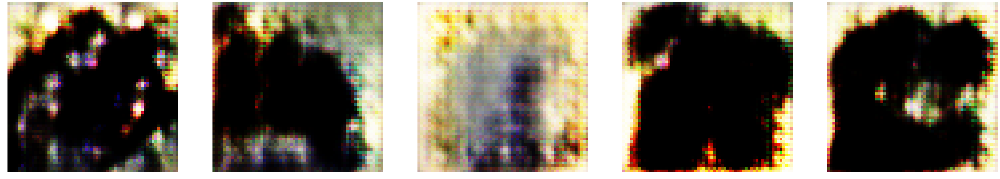

Epoch 6/100 
Duration: 37.23789 
D Loss: 0.55901 
G Loss: 1.16066


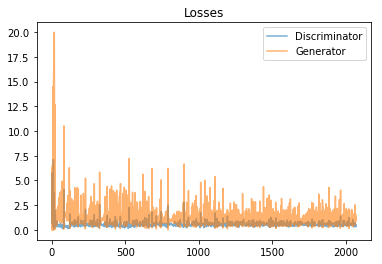

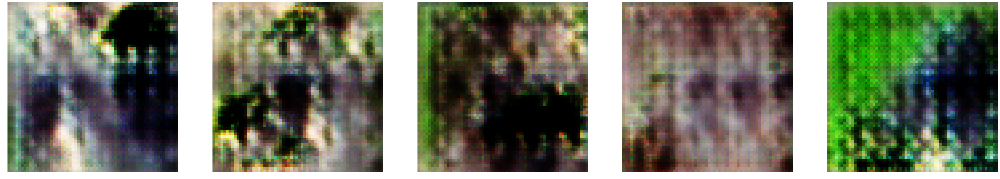

Epoch 7/100 
Duration: 37.30723 
D Loss: 0.57431 
G Loss: 1.10480


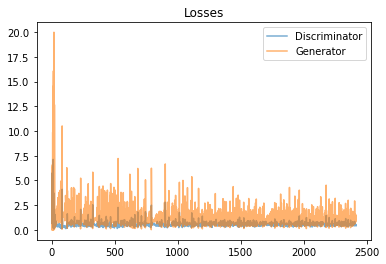

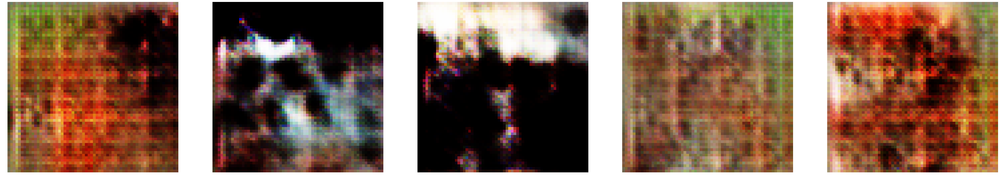

Epoch 8/100 
Duration: 37.28758 
D Loss: 0.53402 
G Loss: 1.25651


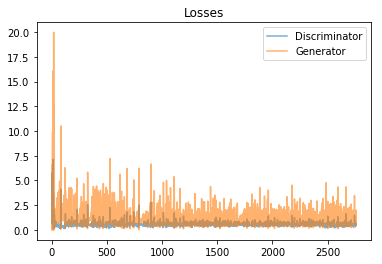

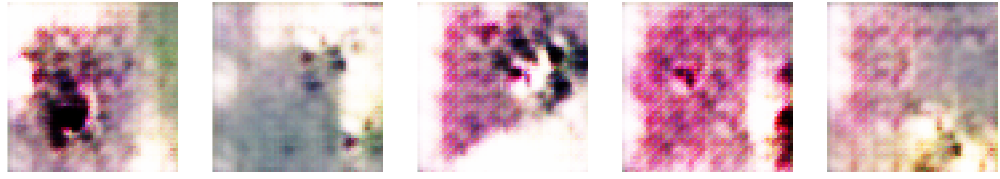

Epoch 9/100 
Duration: 37.33742 
D Loss: 0.55690 
G Loss: 1.16301


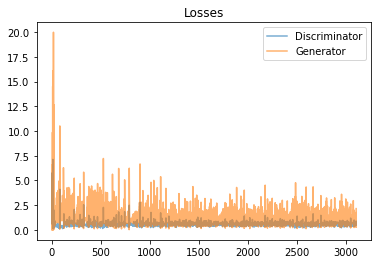

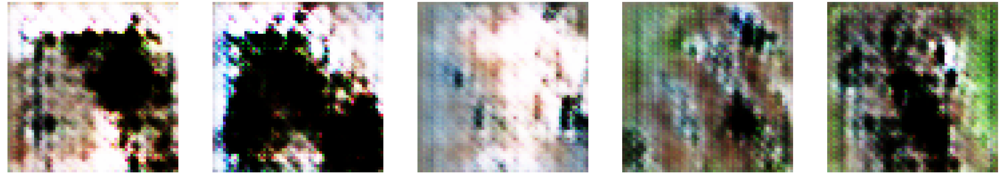

Epoch 10/100 
Duration: 37.24215 
D Loss: 0.54752 
G Loss: 1.20837


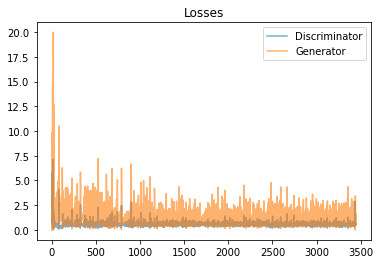

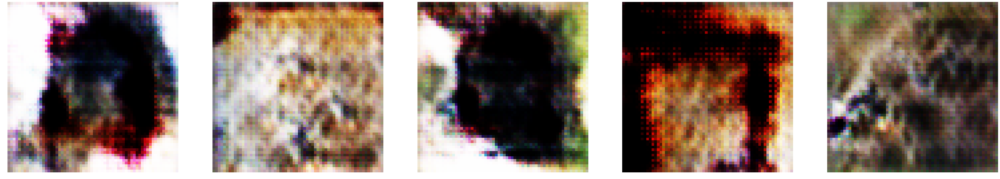

Epoch 11/100 
Duration: 37.33460 
D Loss: 0.54329 
G Loss: 1.15656


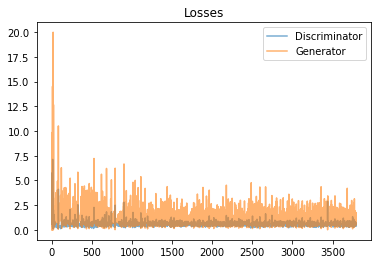

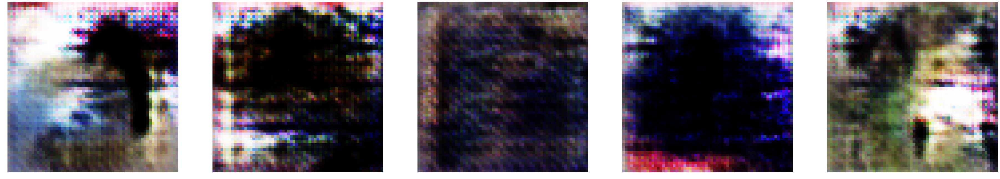

Epoch 12/100 
Duration: 37.19555 
D Loss: 0.54733 
G Loss: 1.17775


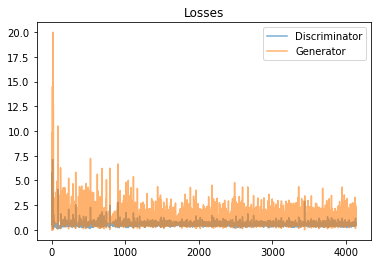

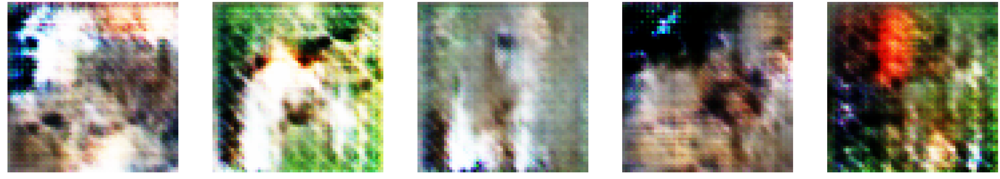

Epoch 13/100 
Duration: 37.28497 
D Loss: 0.53090 
G Loss: 1.20110


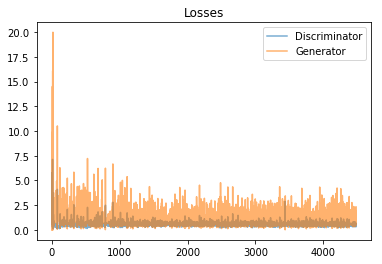

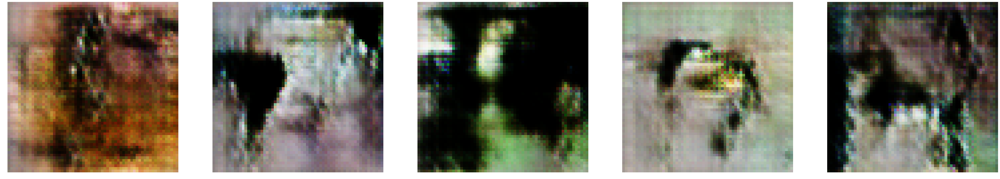

Epoch 14/100 
Duration: 37.30644 
D Loss: 0.54176 
G Loss: 1.17679


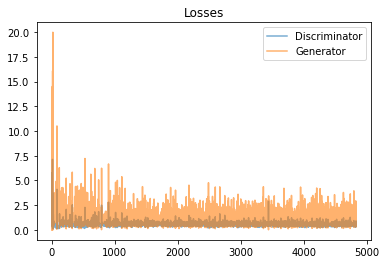

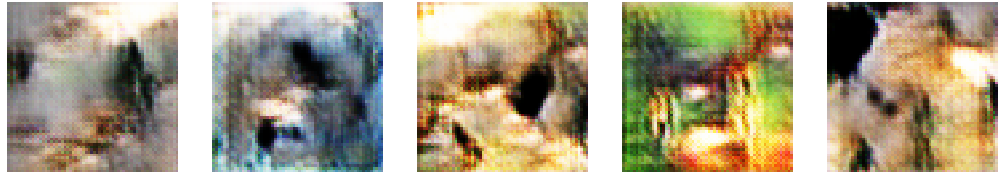

Epoch 15/100 
Duration: 37.21922 
D Loss: 0.51873 
G Loss: 1.26302


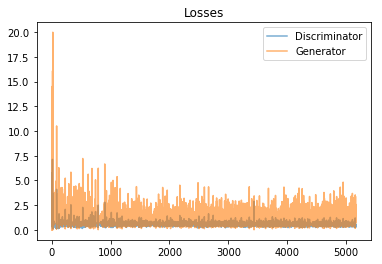

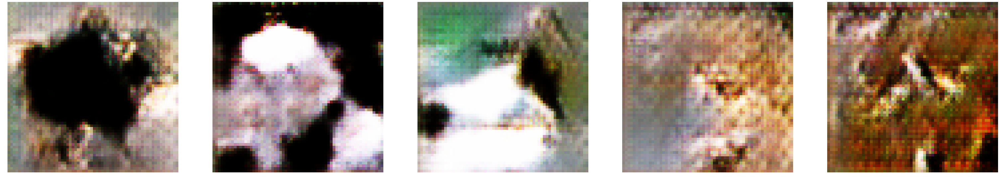

Epoch 16/100 
Duration: 36.85884 
D Loss: 0.51074 
G Loss: 1.31460


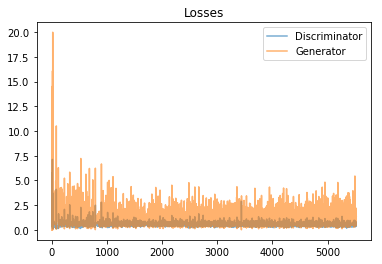

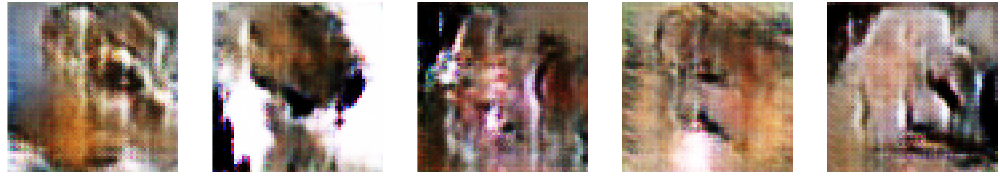

Epoch 17/100 
Duration: 36.96283 
D Loss: 0.52466 
G Loss: 1.23967


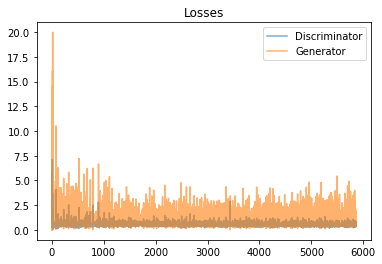

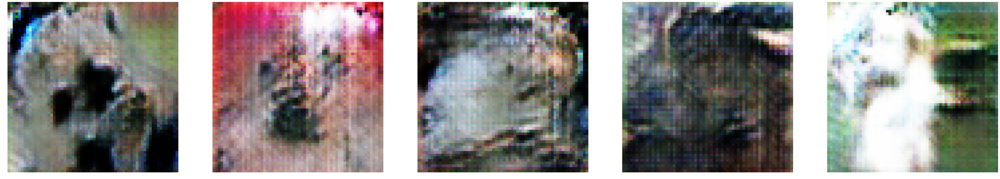

Epoch 18/100 
Duration: 37.23202 
D Loss: 0.52581 
G Loss: 1.22815


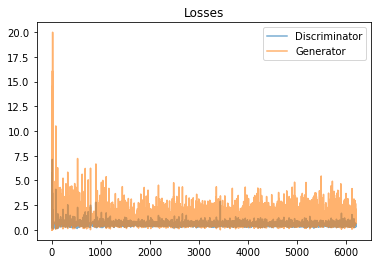

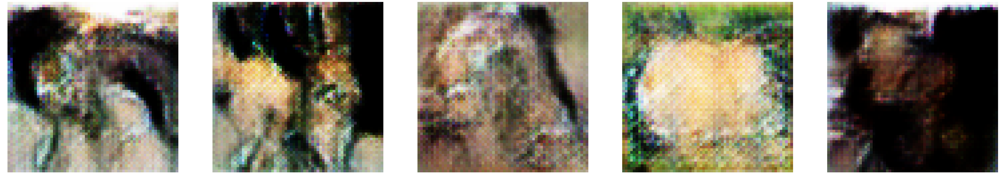

Epoch 19/100 
Duration: 37.28474 
D Loss: 0.52572 
G Loss: 1.19375


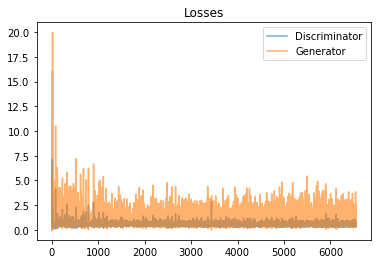

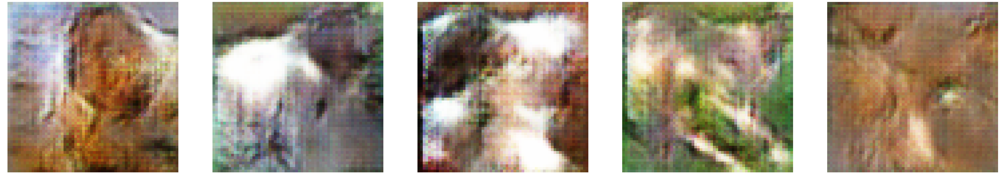

Epoch 20/100 
Duration: 37.27585 
D Loss: 0.53133 
G Loss: 1.19216


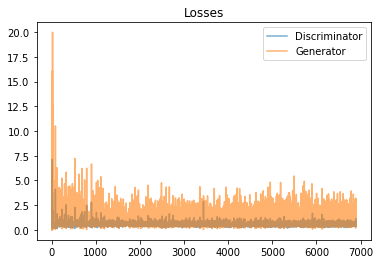

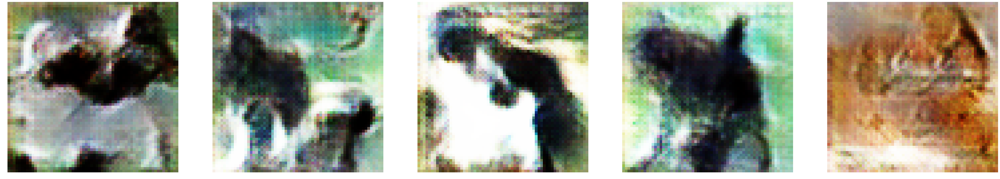

Epoch 21/100 
Duration: 37.22950 
D Loss: 0.55309 
G Loss: 1.15521


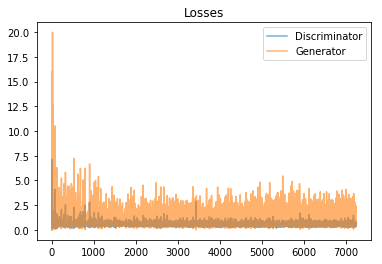

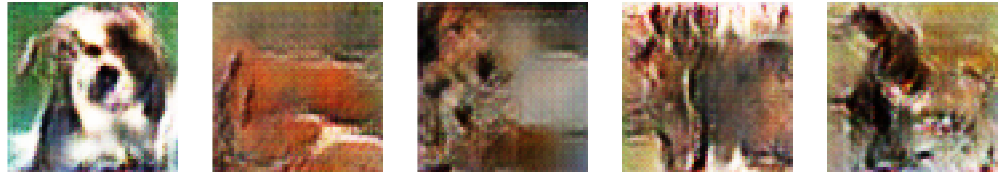

Epoch 22/100 
Duration: 37.16555 
D Loss: 0.54512 
G Loss: 1.11148


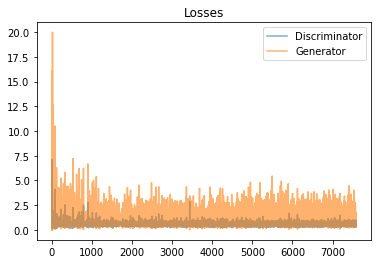

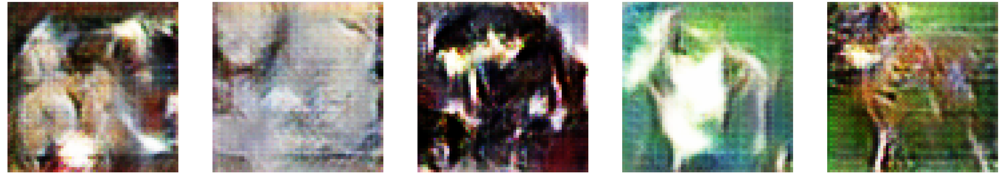

Epoch 23/100 
Duration: 37.23399 
D Loss: 0.55736 
G Loss: 1.11927


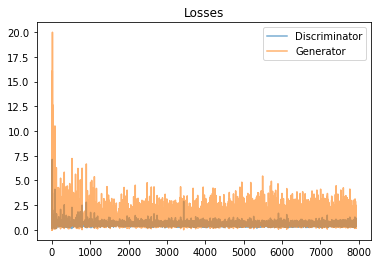

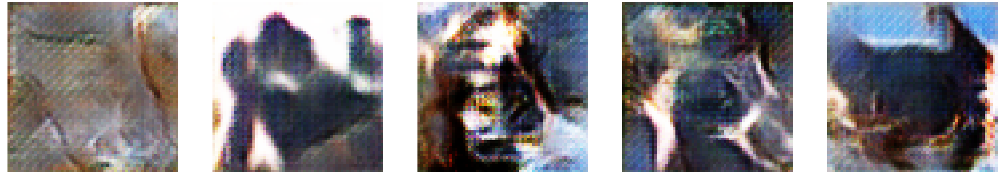

Epoch 24/100 
Duration: 37.24005 
D Loss: 0.55423 
G Loss: 1.08209


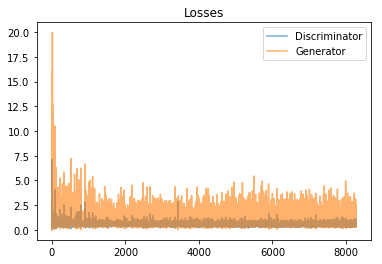

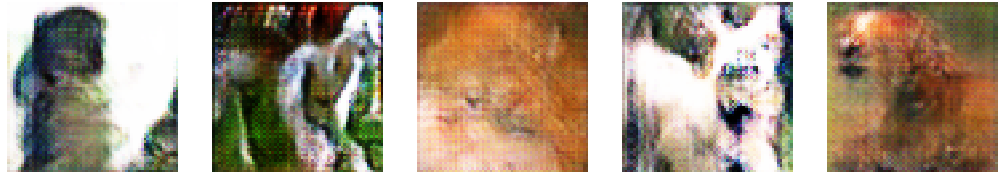

Epoch 25/100 
Duration: 37.33012 
D Loss: 0.56057 
G Loss: 1.13205


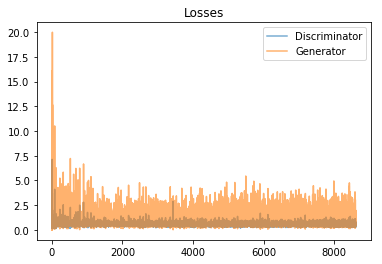

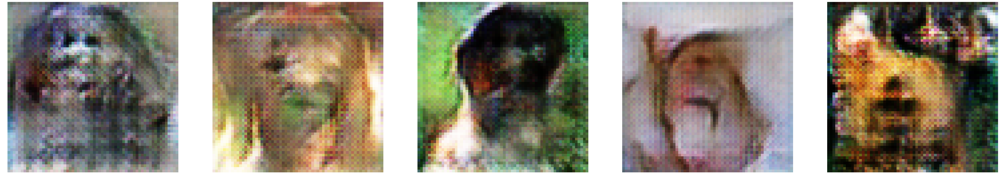

Epoch 26/100 
Duration: 37.20033 
D Loss: 0.58511 
G Loss: 1.09004


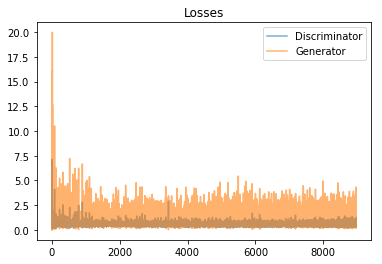

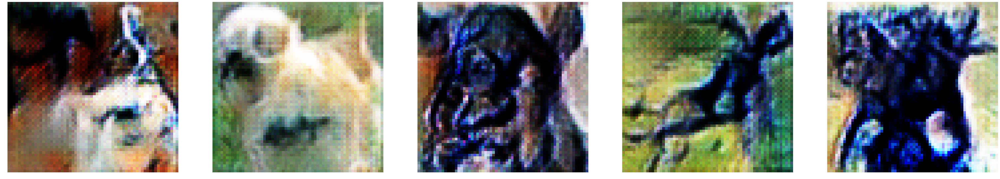

Epoch 27/100 
Duration: 37.19145 
D Loss: 0.57664 
G Loss: 1.12761


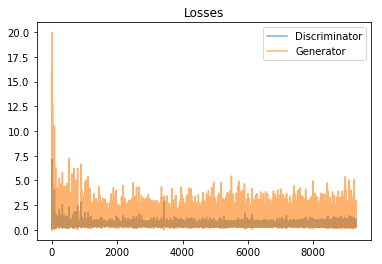

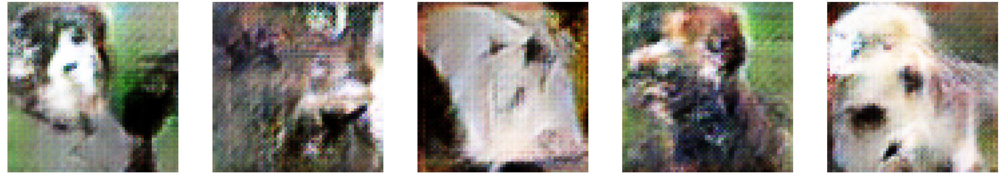

Epoch 28/100 
Duration: 37.15806 
D Loss: 0.57415 
G Loss: 1.16995


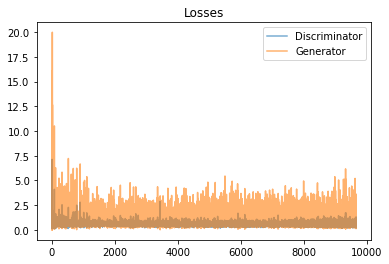

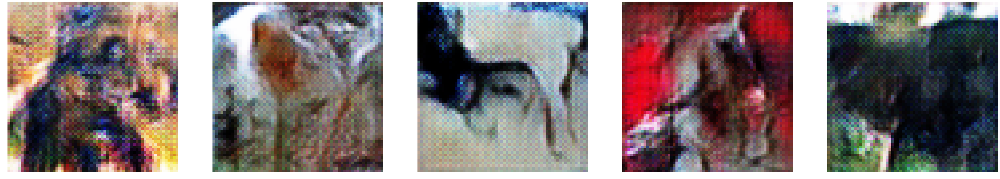

Epoch 29/100 
Duration: 36.88877 
D Loss: 0.60638 
G Loss: 1.08273


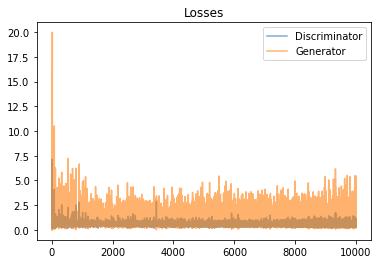

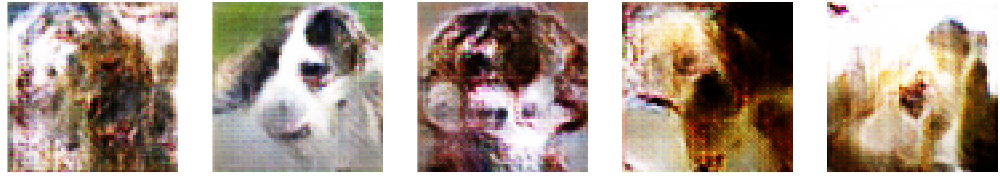

Epoch 30/100 
Duration: 37.28599 
D Loss: 0.58960 
G Loss: 1.14467


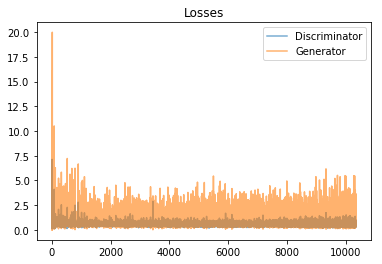

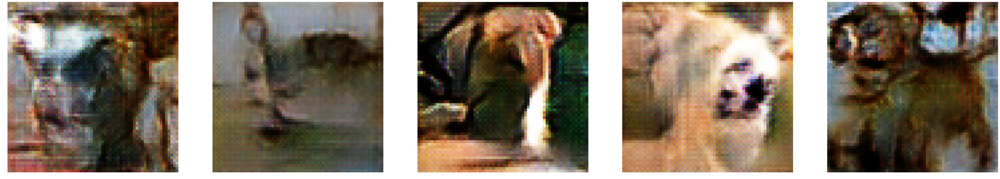

Epoch 31/100 
Duration: 37.24232 
D Loss: 0.59285 
G Loss: 1.15419


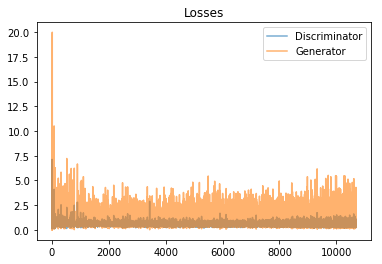

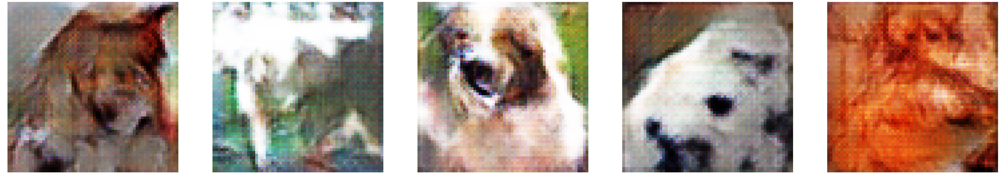

Epoch 32/100 
Duration: 36.95107 
D Loss: 0.58016 
G Loss: 1.19457


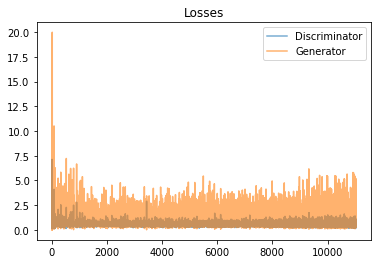

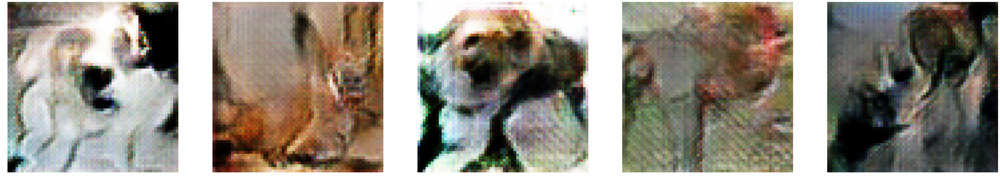

Epoch 33/100 
Duration: 36.85782 
D Loss: 0.60670 
G Loss: 1.18305


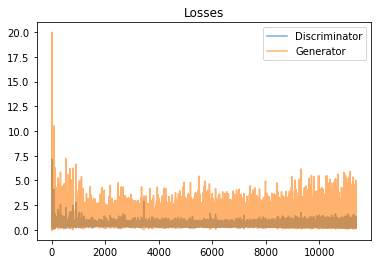

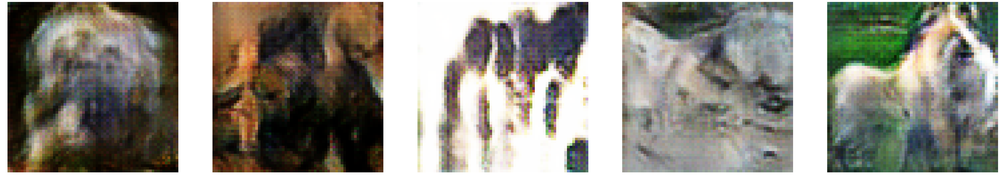

Epoch 34/100 
Duration: 36.82757 
D Loss: 0.61190 
G Loss: 1.21030


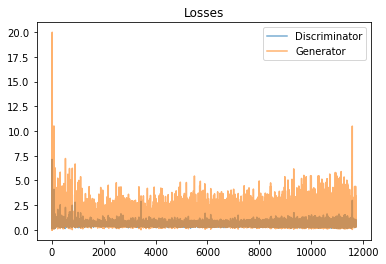

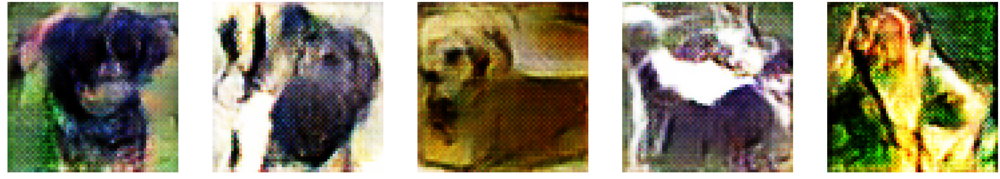

Epoch 35/100 
Duration: 36.88390 
D Loss: 0.57700 
G Loss: 1.06832


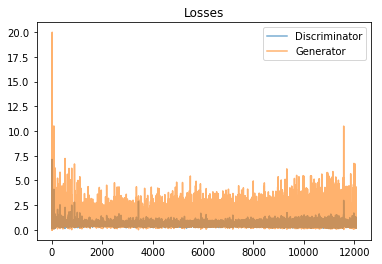

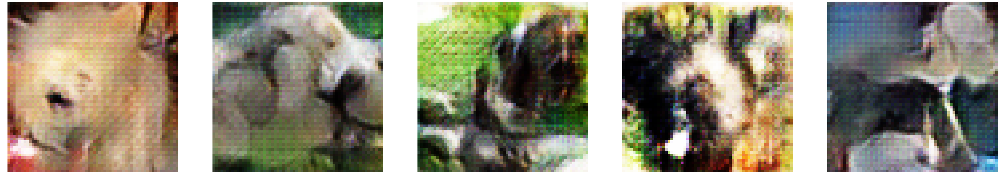

Epoch 36/100 
Duration: 37.28643 
D Loss: 0.62648 
G Loss: 1.13125


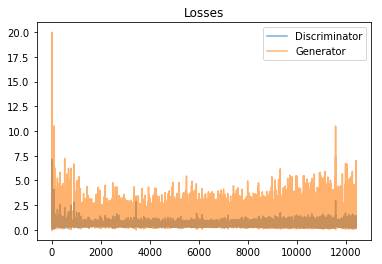

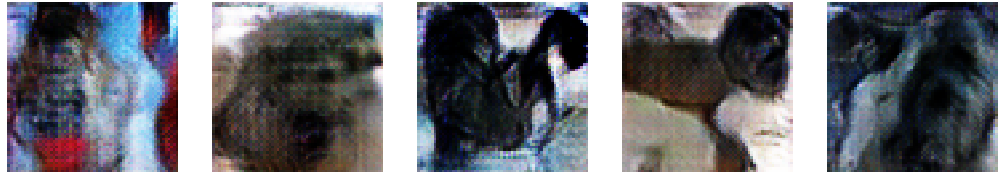

Epoch 37/100 
Duration: 36.78388 
D Loss: 0.60668 
G Loss: 1.19029


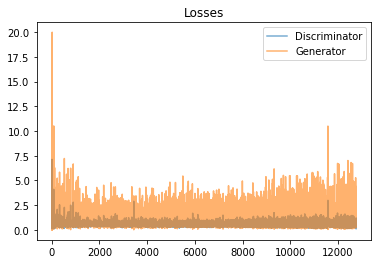

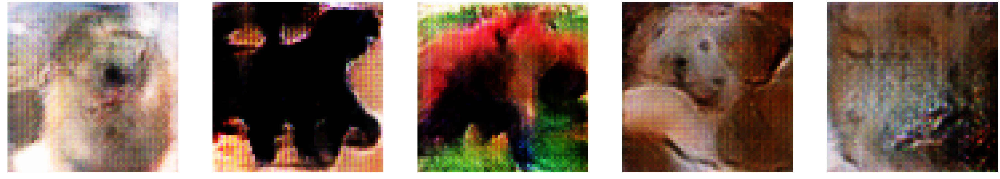

Epoch 38/100 
Duration: 37.22278 
D Loss: 0.60906 
G Loss: 1.20194


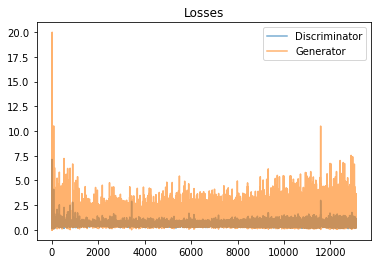

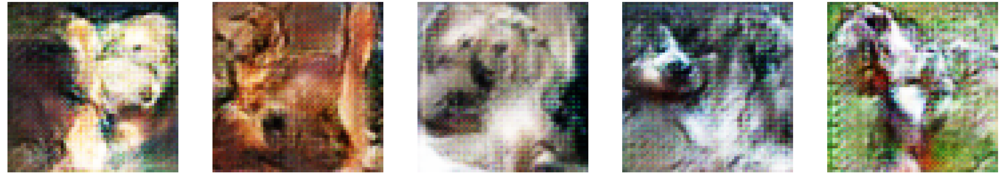

Epoch 39/100 
Duration: 37.19516 
D Loss: 0.61632 
G Loss: 1.15784


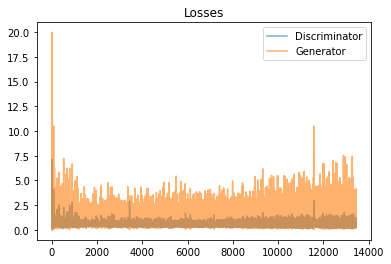

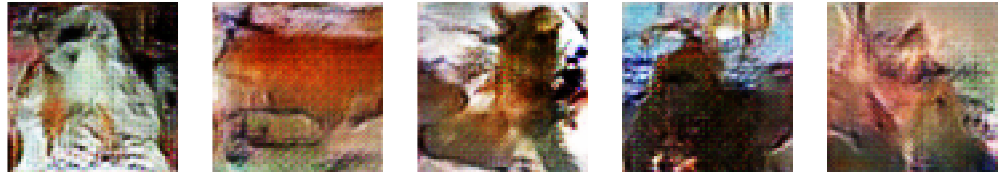

Epoch 40/100 
Duration: 37.12253 
D Loss: 0.62504 
G Loss: 1.15099


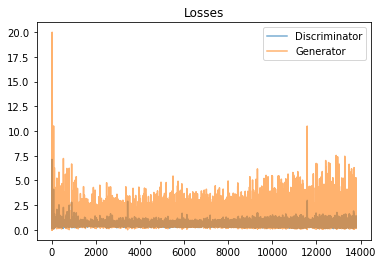

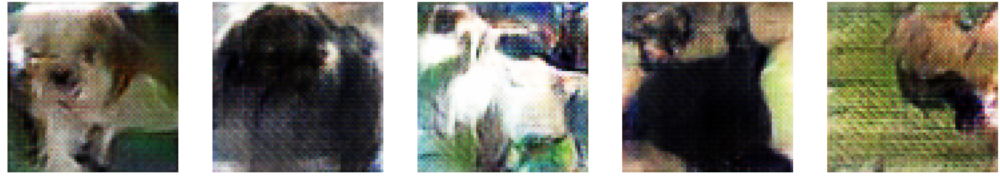

Epoch 41/100 
Duration: 37.14998 
D Loss: 0.59191 
G Loss: 1.21400


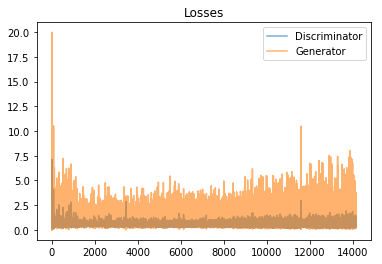

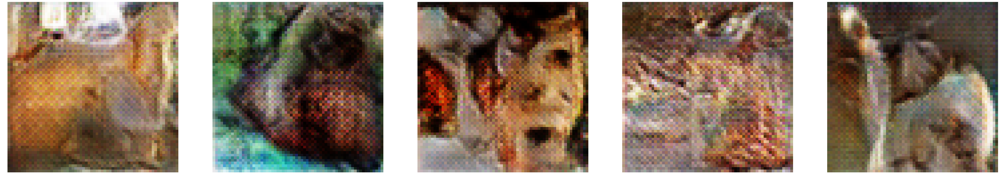

Epoch 42/100 
Duration: 36.84328 
D Loss: 0.63229 
G Loss: 1.06040


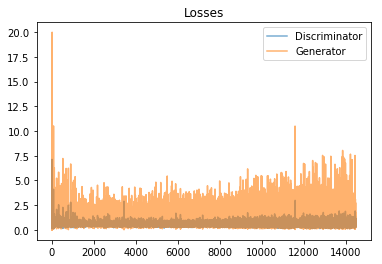

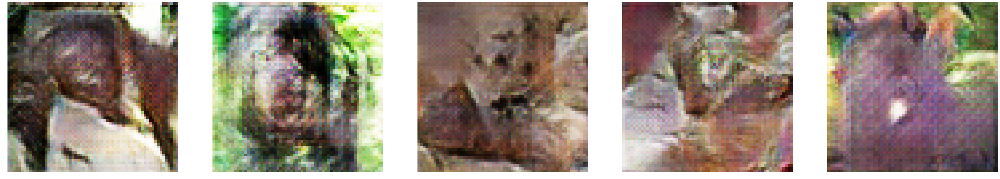

Epoch 43/100 
Duration: 37.14249 
D Loss: 0.63622 
G Loss: 1.23672


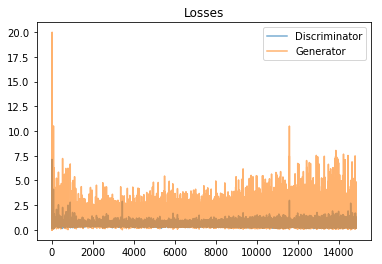

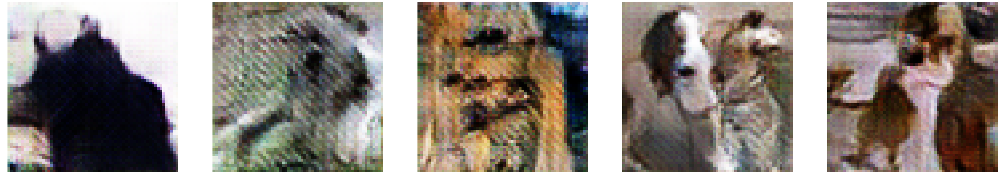

Epoch 44/100 
Duration: 37.26777 
D Loss: 0.60910 
G Loss: 1.18517


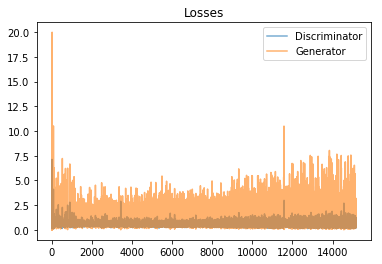

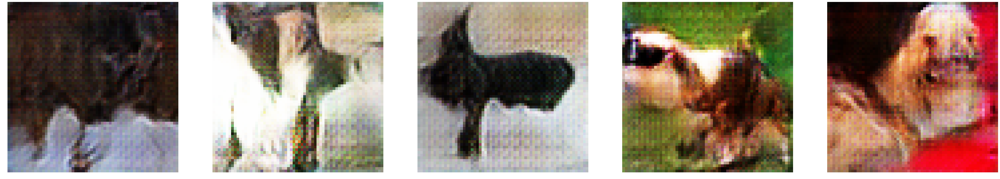

Epoch 45/100 
Duration: 37.11829 
D Loss: 0.59961 
G Loss: 1.11649


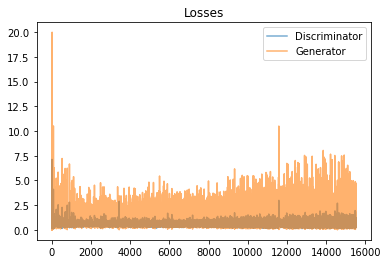

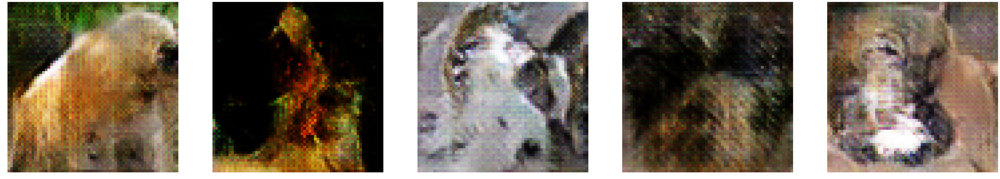

Epoch 46/100 
Duration: 37.07895 
D Loss: 0.60221 
G Loss: 1.20146


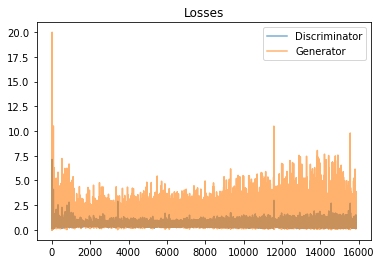

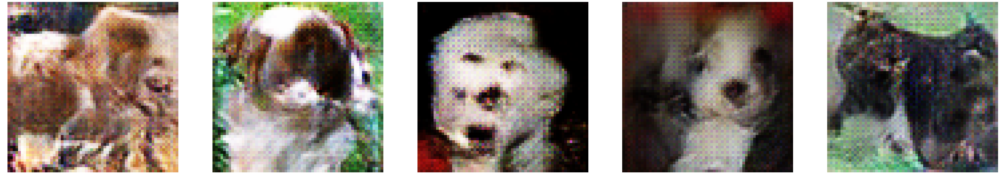

Epoch 47/100 
Duration: 37.26336 
D Loss: 0.63249 
G Loss: 1.21105


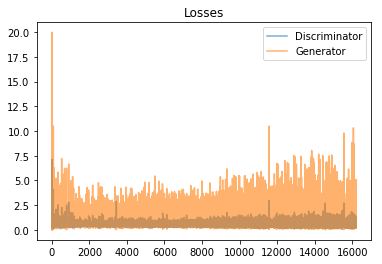

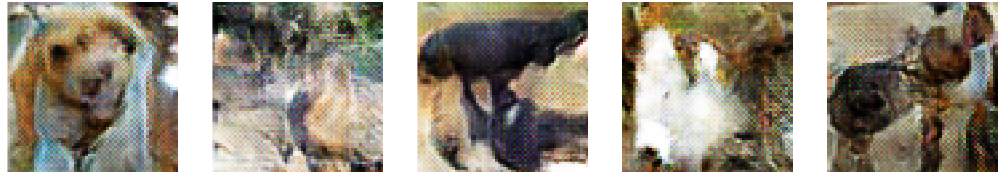

Epoch 48/100 
Duration: 37.22137 
D Loss: 0.59643 
G Loss: 1.17750


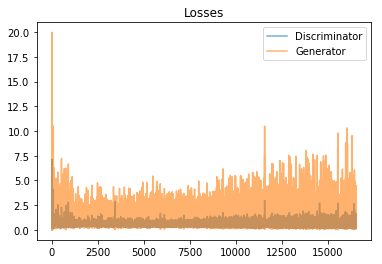

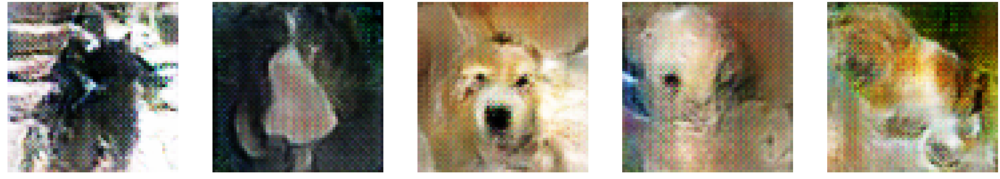

Epoch 49/100 
Duration: 37.08631 
D Loss: 0.63471 
G Loss: 1.22203


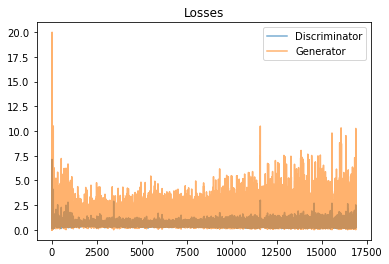

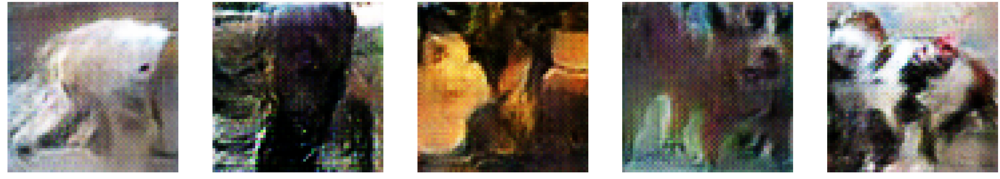

Epoch 50/100 
Duration: 37.12503 
D Loss: 0.60332 
G Loss: 1.13643


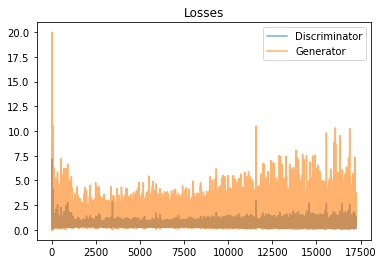

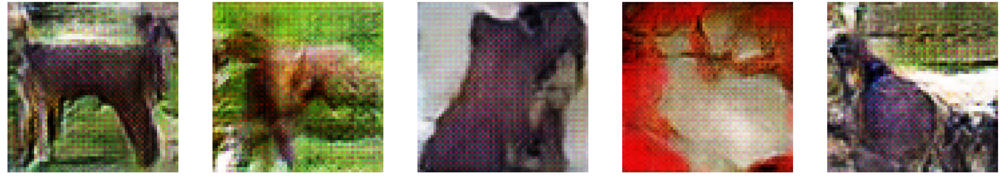

Epoch 51/100 
Duration: 37.20189 
D Loss: 0.61842 
G Loss: 1.22146


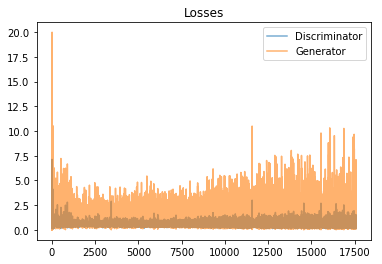

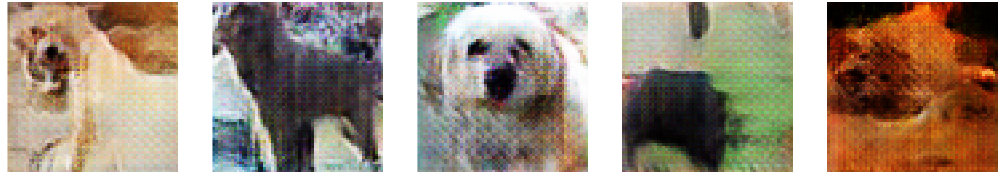

Epoch 52/100 
Duration: 37.14505 
D Loss: 0.60325 
G Loss: 1.31061


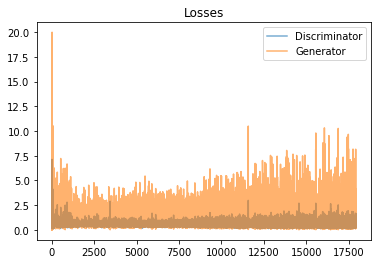

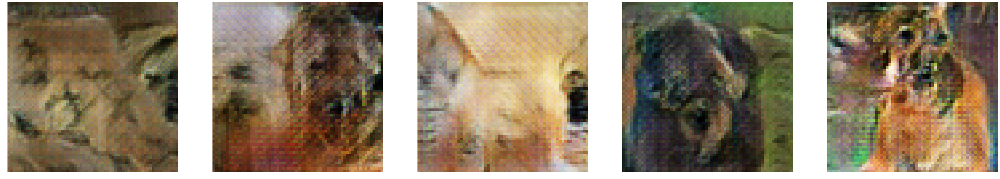

Epoch 53/100 
Duration: 37.16243 
D Loss: 0.63353 
G Loss: 1.27220


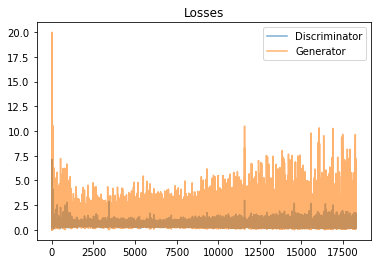

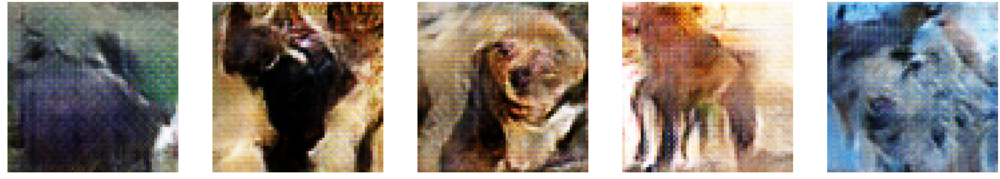

Epoch 54/100 
Duration: 37.13396 
D Loss: 0.60782 
G Loss: 1.26567


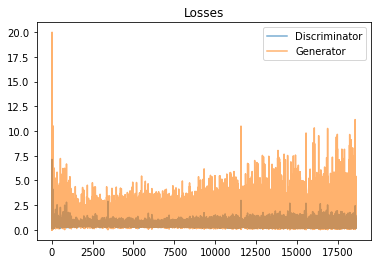

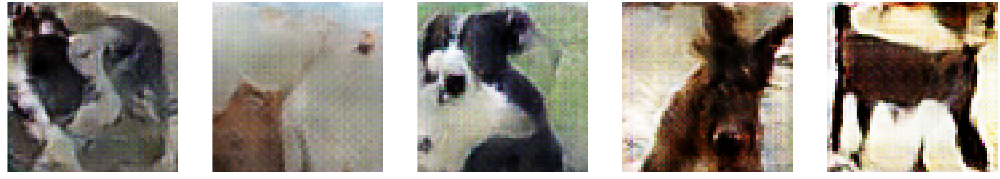

Epoch 55/100 
Duration: 37.24069 
D Loss: 0.58837 
G Loss: 1.27858


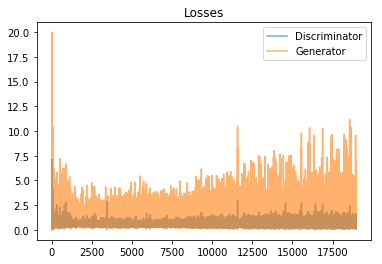

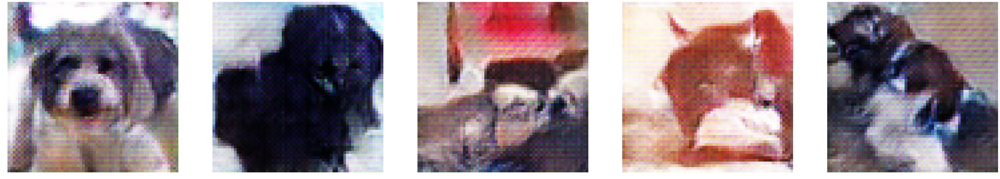

Epoch 56/100 
Duration: 37.29262 
D Loss: 0.60182 
G Loss: 1.25429


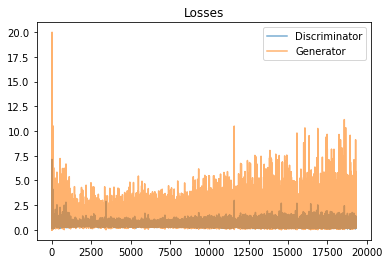

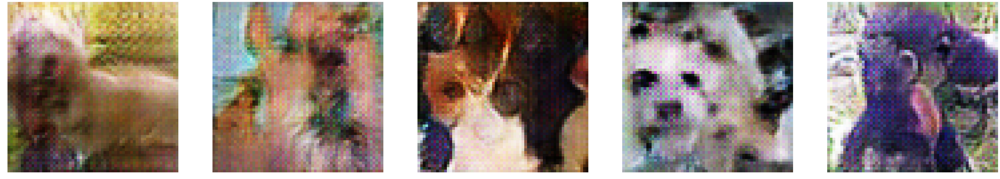

Epoch 57/100 
Duration: 37.20900 
D Loss: 0.58637 
G Loss: 1.28580


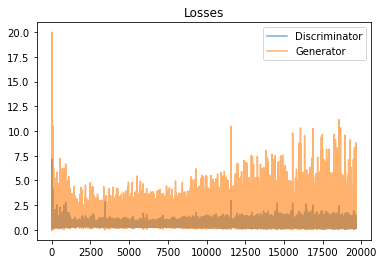

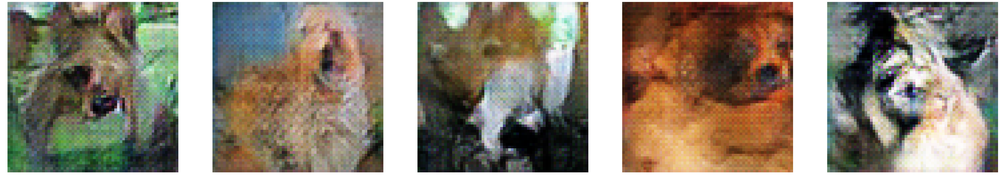

Epoch 58/100 
Duration: 37.14190 
D Loss: 0.57879 
G Loss: 1.19953


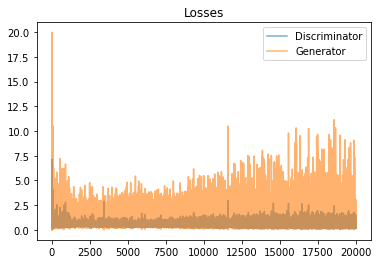

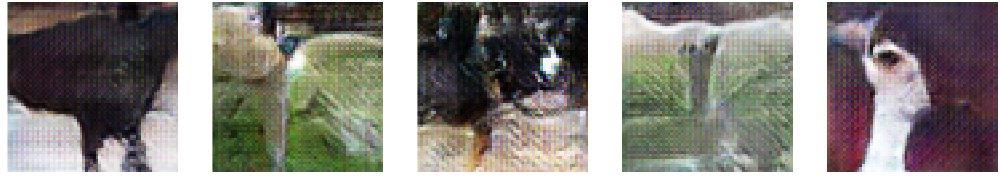

Epoch 59/100 
Duration: 37.18353 
D Loss: 0.62181 
G Loss: 1.47187


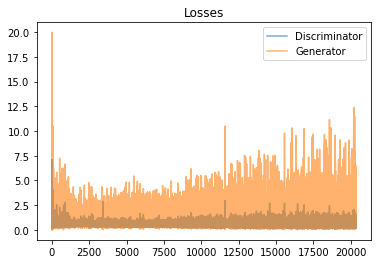

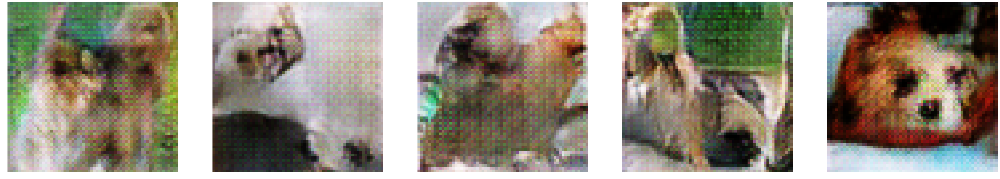

Epoch 60/100 
Duration: 37.14735 
D Loss: 0.56147 
G Loss: 1.25935


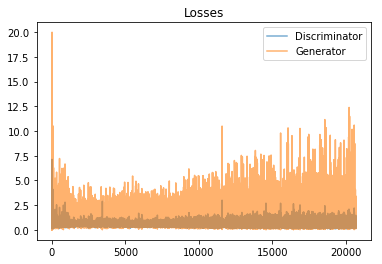

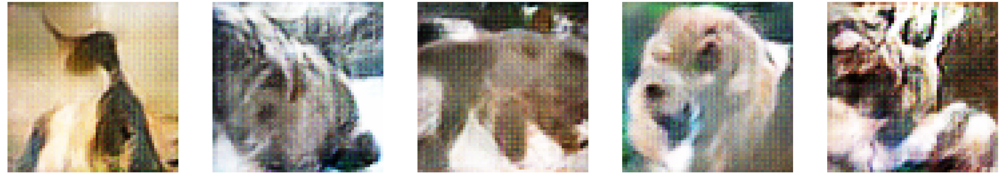

Epoch 61/100 
Duration: 37.13216 
D Loss: 0.60486 
G Loss: 1.31892


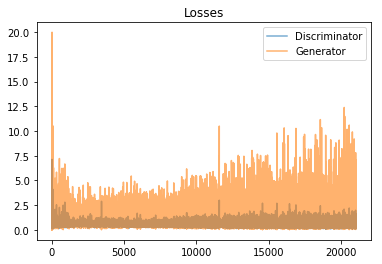

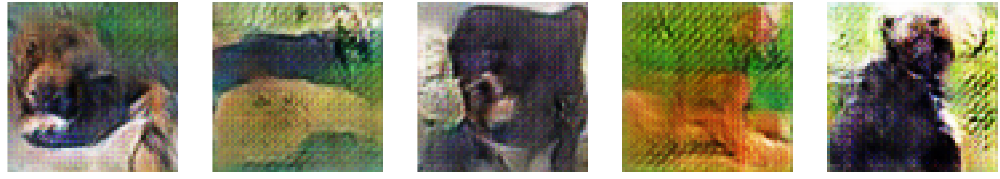

Epoch 62/100 
Duration: 36.80938 
D Loss: 0.53231 
G Loss: 1.22006


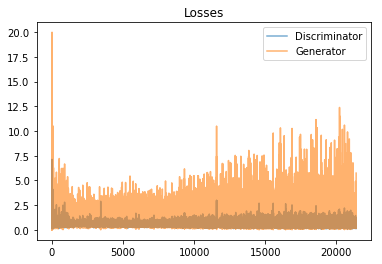

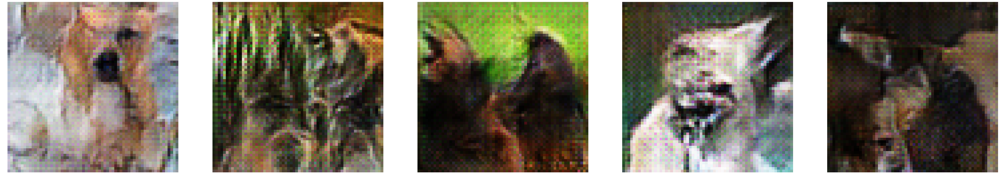

Epoch 63/100 
Duration: 37.24304 
D Loss: 0.56022 
G Loss: 1.14932


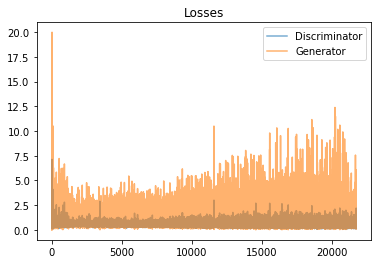

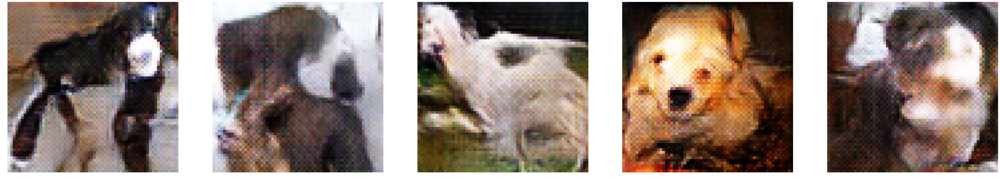

Epoch 64/100 
Duration: 37.09796 
D Loss: 0.64260 
G Loss: 1.57338


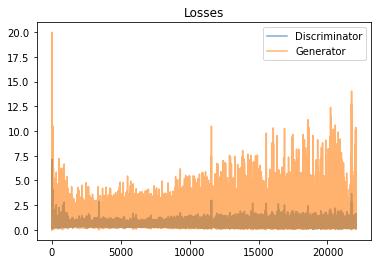

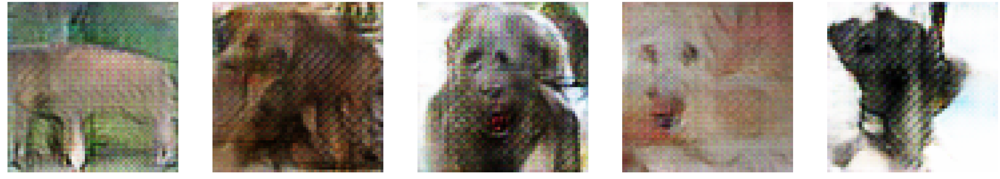

Epoch 65/100 
Duration: 36.81882 
D Loss: 0.53846 
G Loss: 1.09140


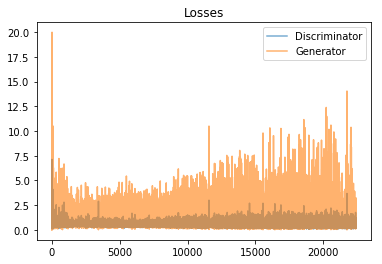

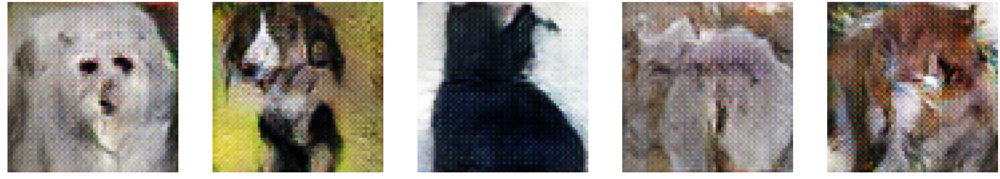

Epoch 66/100 
Duration: 37.11816 
D Loss: 0.55358 
G Loss: 1.22842


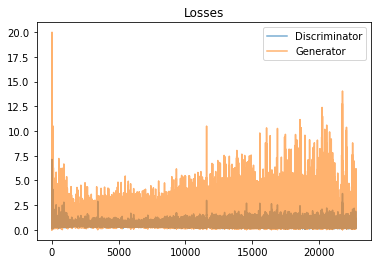

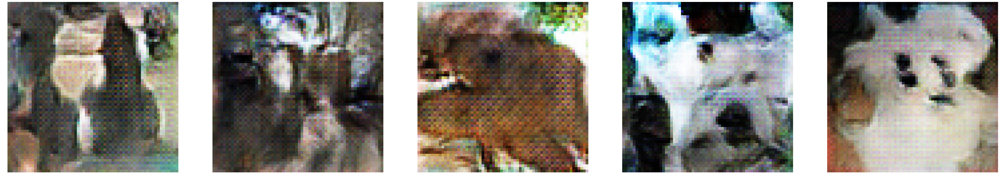

Epoch 67/100 
Duration: 36.87526 
D Loss: 0.52334 
G Loss: 1.28396


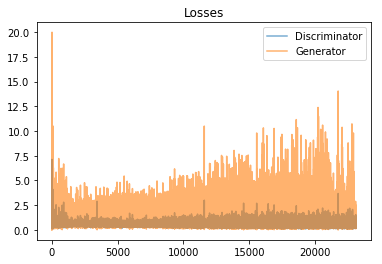

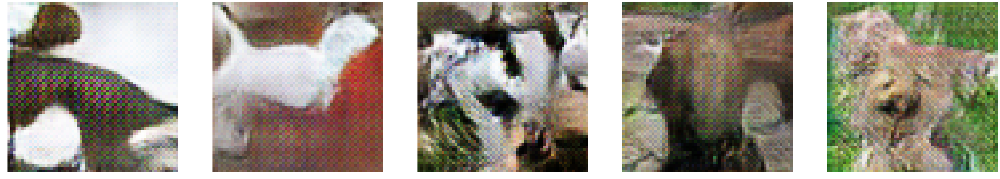

Epoch 68/100 
Duration: 37.10414 
D Loss: 0.60874 
G Loss: 1.66584


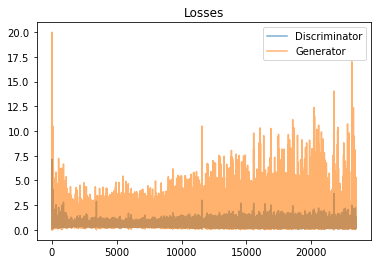

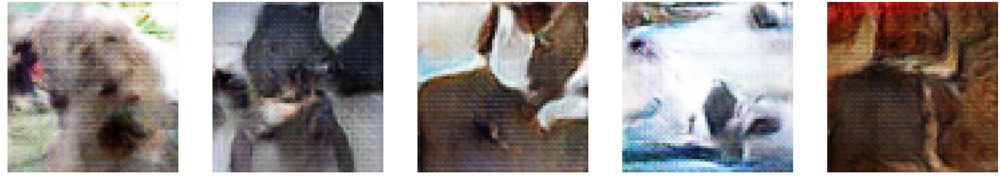

Epoch 69/100 
Duration: 37.19488 
D Loss: 0.53610 
G Loss: 1.36615


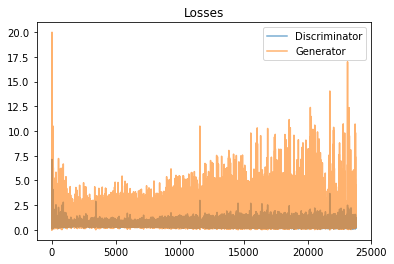

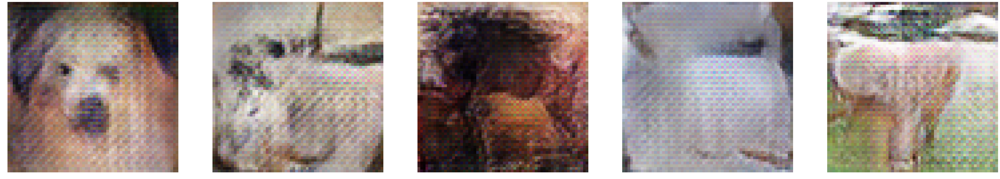

Epoch 70/100 
Duration: 37.13271 
D Loss: 0.50787 
G Loss: 1.22767


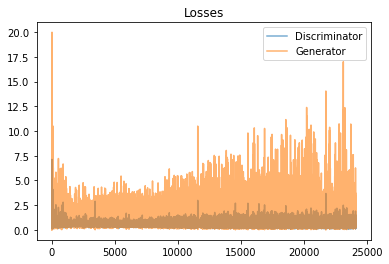

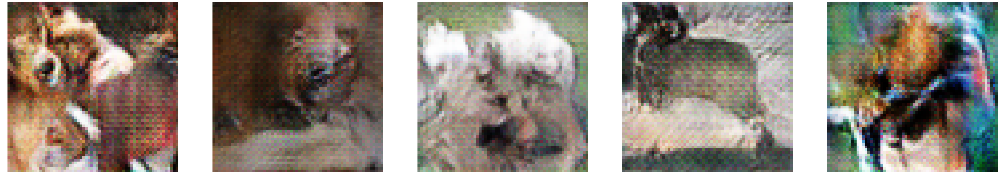

Epoch 71/100 
Duration: 37.29508 
D Loss: 0.53564 
G Loss: 1.33964


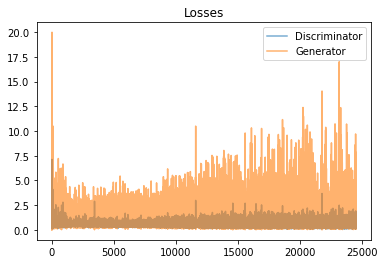

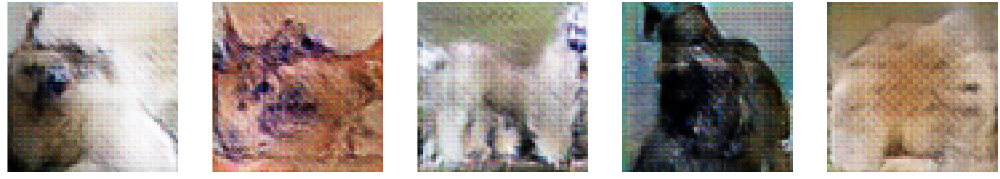

Epoch 72/100 
Duration: 36.89896 
D Loss: 0.55271 
G Loss: 1.32111


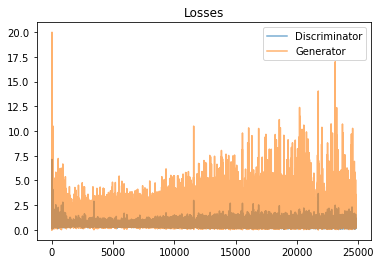

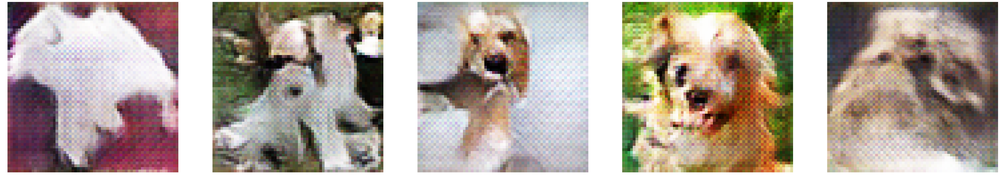

Epoch 73/100 
Duration: 36.82240 
D Loss: 0.54262 
G Loss: 1.56449


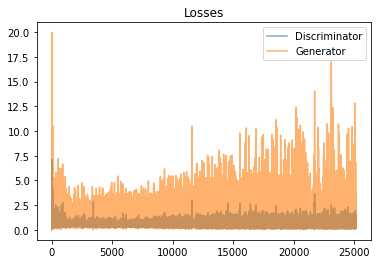

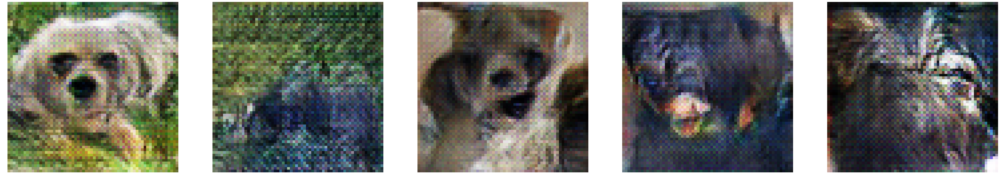

Epoch 74/100 
Duration: 37.14043 
D Loss: 0.49301 
G Loss: 1.24898


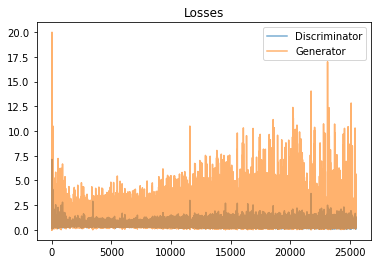

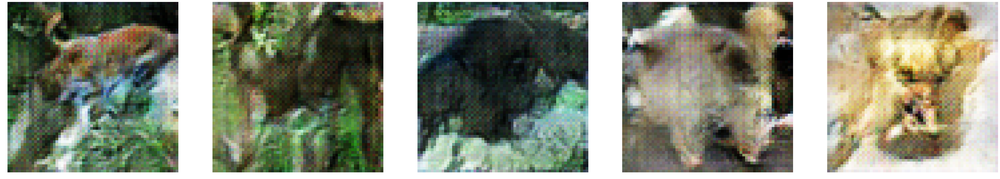

Epoch 75/100 
Duration: 37.17706 
D Loss: 0.48512 
G Loss: 1.37239


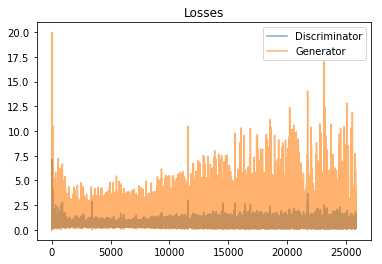

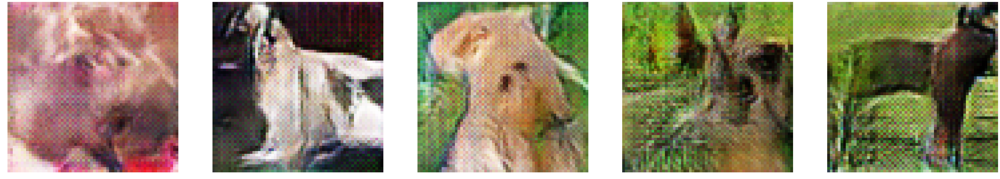

Epoch 76/100 
Duration: 36.84299 
D Loss: 0.55314 
G Loss: 1.28525


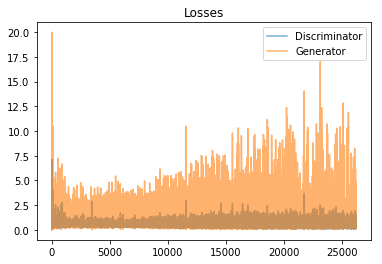

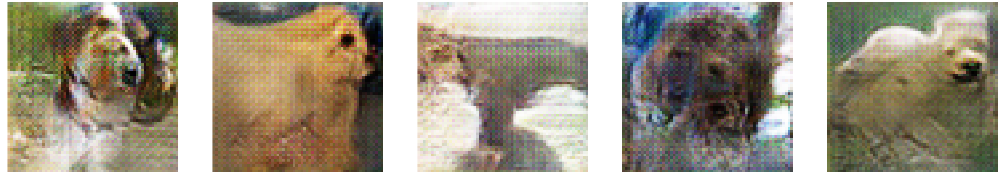

Epoch 77/100 
Duration: 36.81001 
D Loss: 0.62015 
G Loss: 1.67907


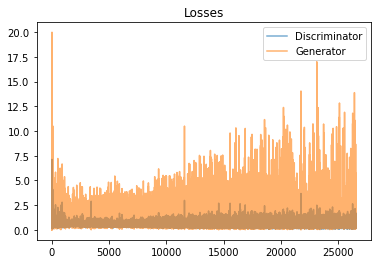

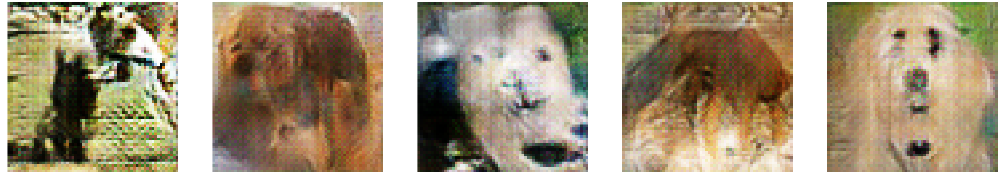

Epoch 78/100 
Duration: 37.34107 
D Loss: 0.50548 
G Loss: 1.25052


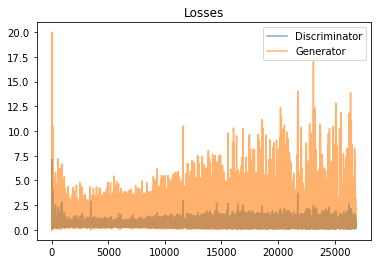

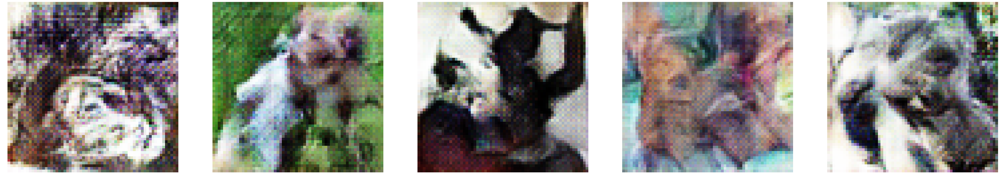

Epoch 79/100 
Duration: 37.95269 
D Loss: 0.51135 
G Loss: 1.21158


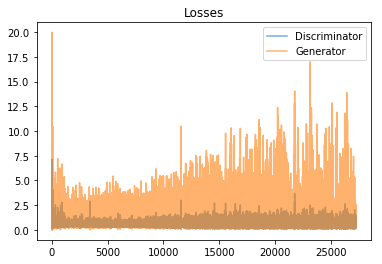

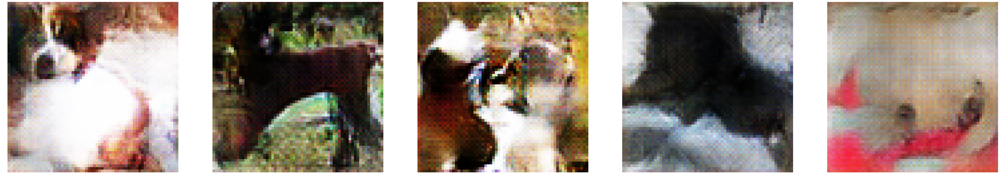

Epoch 80/100 
Duration: 37.82329 
D Loss: 0.48979 
G Loss: 1.41862


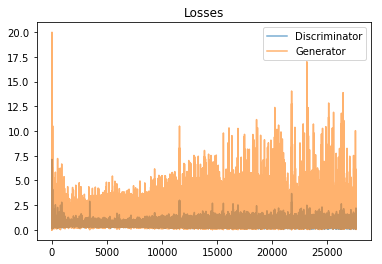

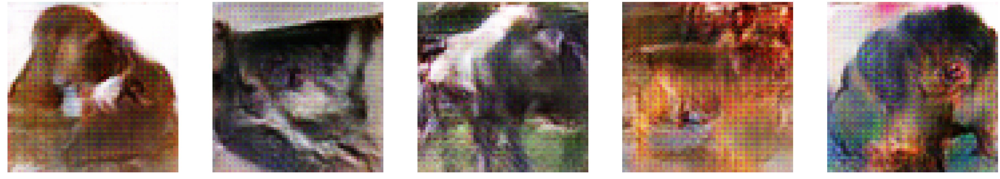

Epoch 81/100 
Duration: 37.89204 
D Loss: 0.52596 
G Loss: 1.52339


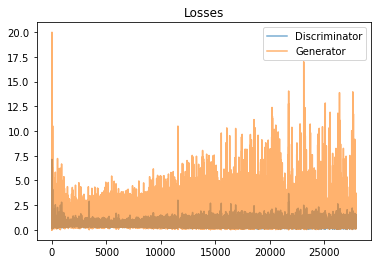

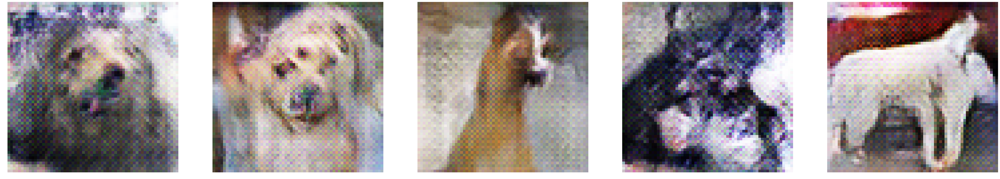

Epoch 82/100 
Duration: 37.28256 
D Loss: 0.51594 
G Loss: 1.35615


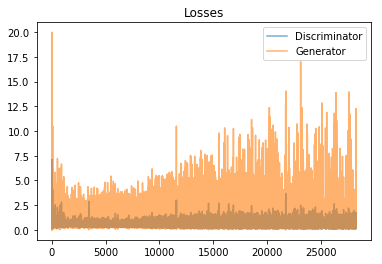

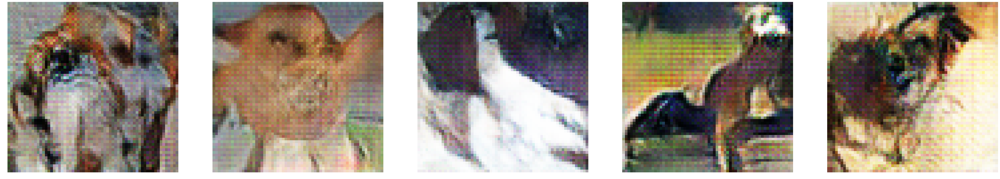

Epoch 83/100 
Duration: 37.14069 
D Loss: 0.53463 
G Loss: 1.66563


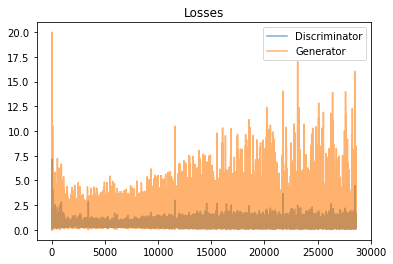

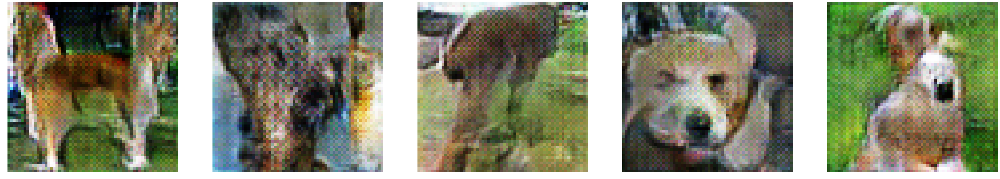

Epoch 84/100 
Duration: 36.90641 
D Loss: 0.49237 
G Loss: 1.28606


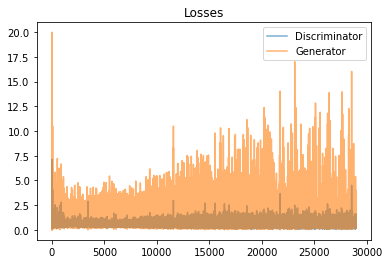

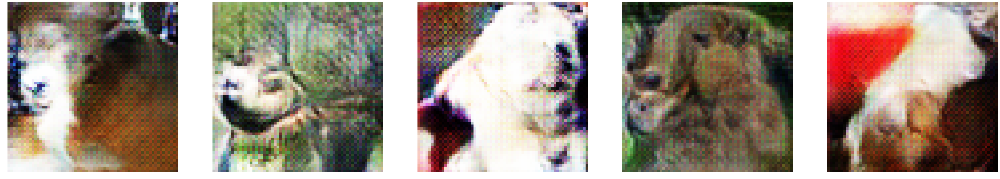

Epoch 85/100 
Duration: 37.23805 
D Loss: 0.46977 
G Loss: 1.26287


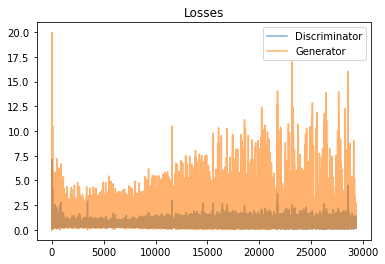

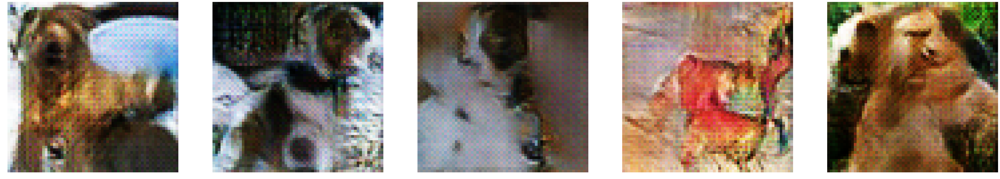

Epoch 86/100 
Duration: 37.21157 
D Loss: 0.49130 
G Loss: 1.46754


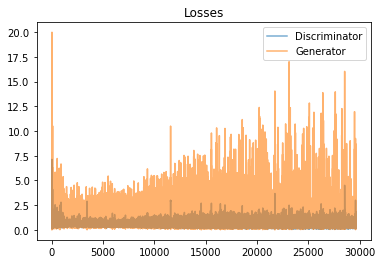

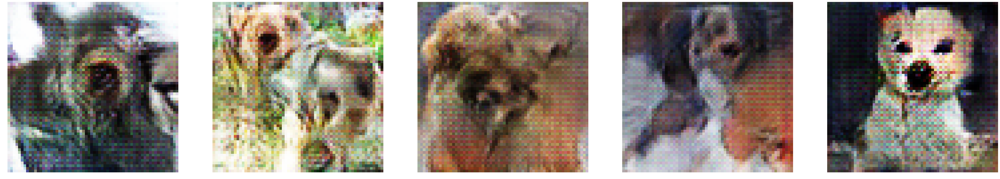

Epoch 87/100 
Duration: 37.14169 
D Loss: 0.47717 
G Loss: 1.35720


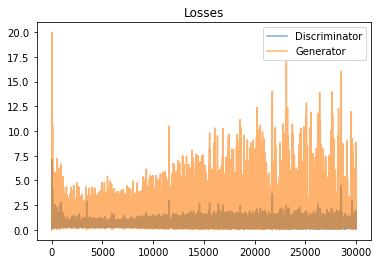

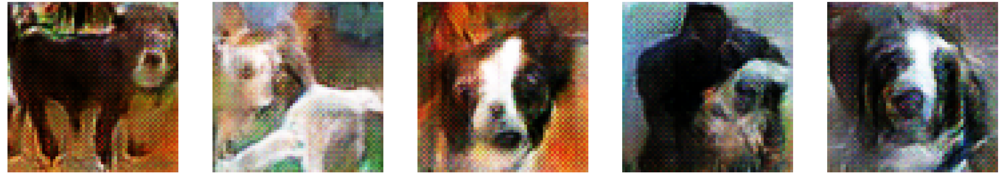

Epoch 88/100 
Duration: 36.78760 
D Loss: 0.49528 
G Loss: 1.39660


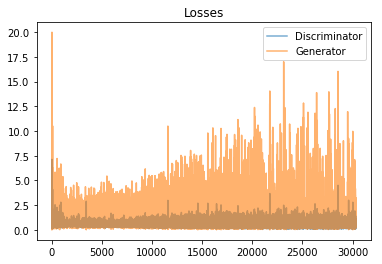

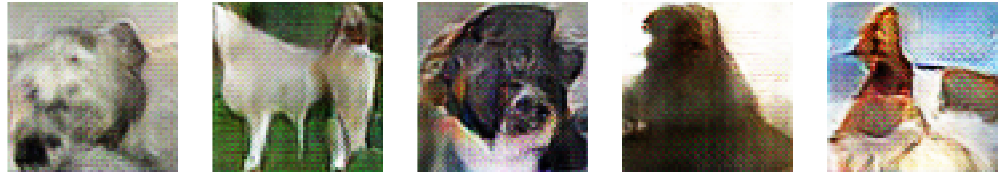

Epoch 89/100 
Duration: 37.10082 
D Loss: 0.47066 
G Loss: 1.48878


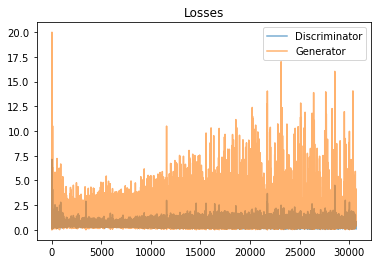

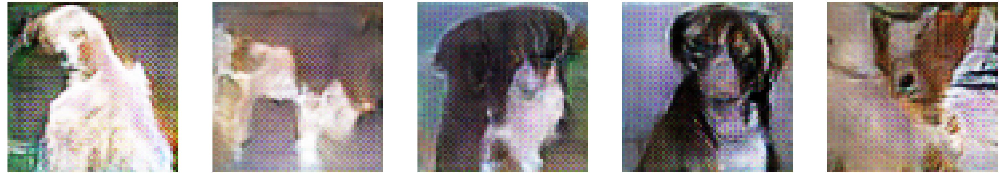

Epoch 90/100 
Duration: 37.15769 
D Loss: 0.47717 
G Loss: 1.34512


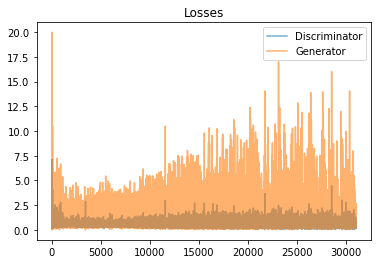

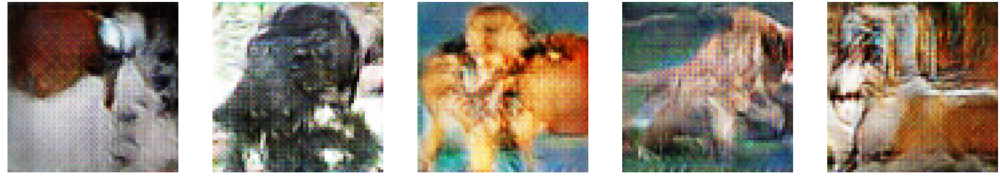

Epoch 91/100 
Duration: 37.13913 
D Loss: 0.53233 
G Loss: 1.67053


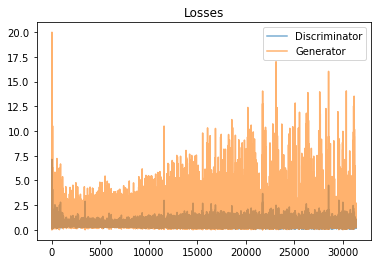

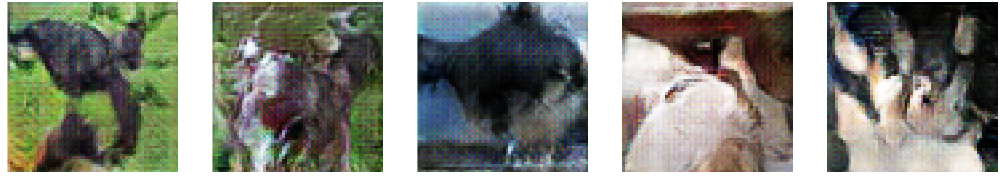

Epoch 92/100 
Duration: 37.12665 
D Loss: 0.43574 
G Loss: 1.47838


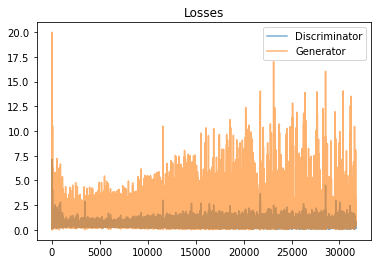

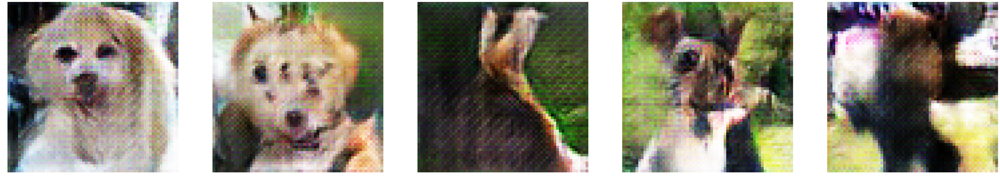

Epoch 93/100 
Duration: 37.15690 
D Loss: 0.41171 
G Loss: 1.56279


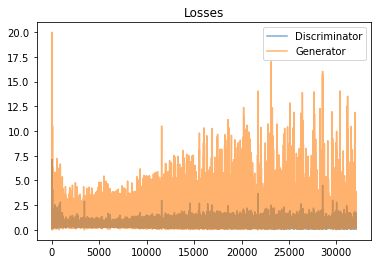

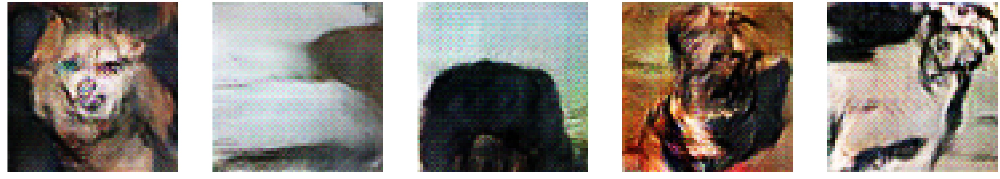

Epoch 94/100 
Duration: 37.14320 
D Loss: 0.45157 
G Loss: 1.65989


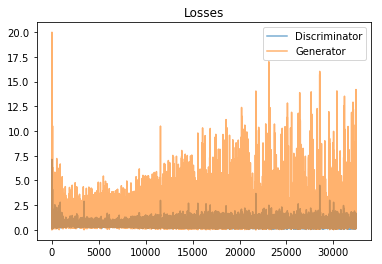

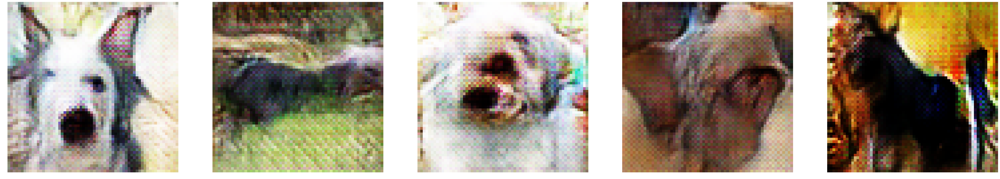

Epoch 95/100 
Duration: 37.12047 
D Loss: 0.43404 
G Loss: 1.48014


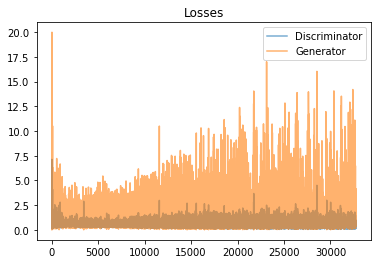

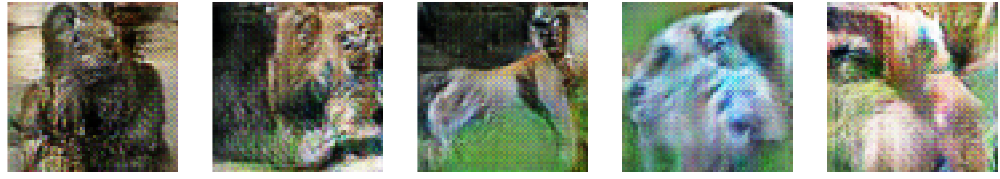

Epoch 96/100 
Duration: 36.84063 
D Loss: 0.42587 
G Loss: 1.48782


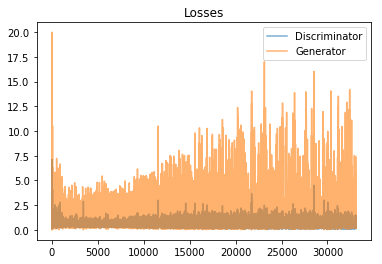

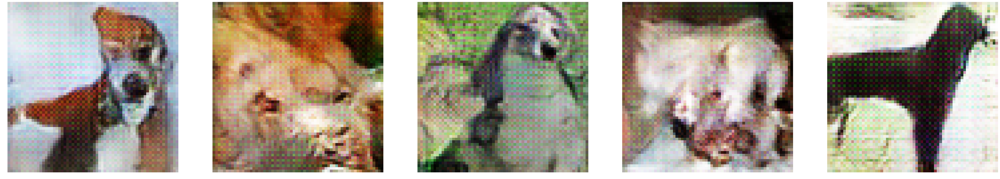

Epoch 97/100 
Duration: 36.79178 
D Loss: 0.48703 
G Loss: 1.91047


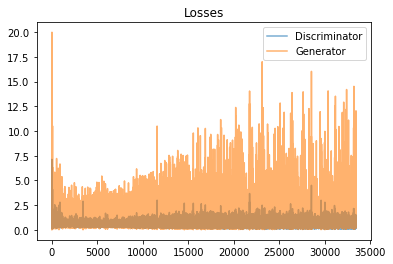

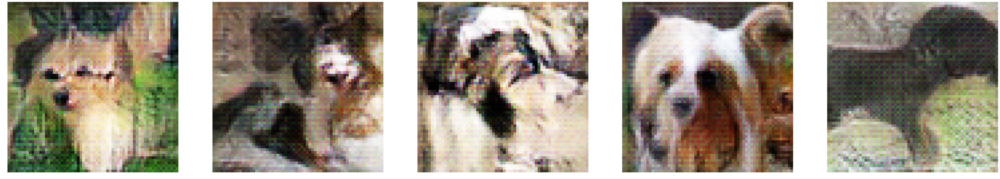

Epoch 98/100 
Duration: 36.86064 
D Loss: 0.47426 
G Loss: 1.70257


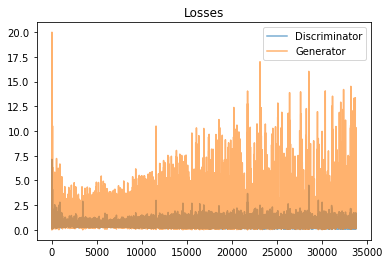

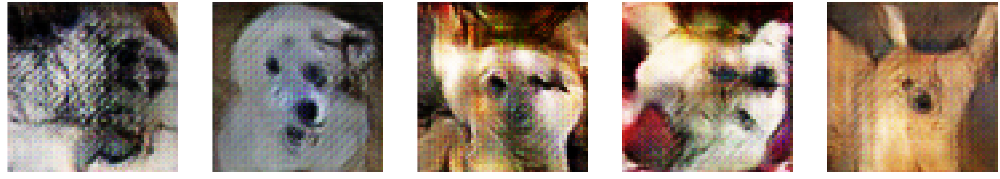

Epoch 99/100 
Duration: 37.11811 
D Loss: 0.44985 
G Loss: 1.42519


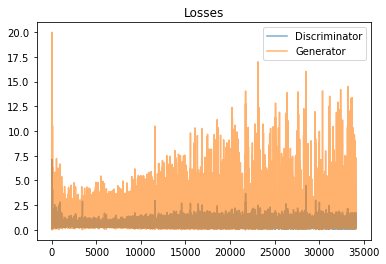

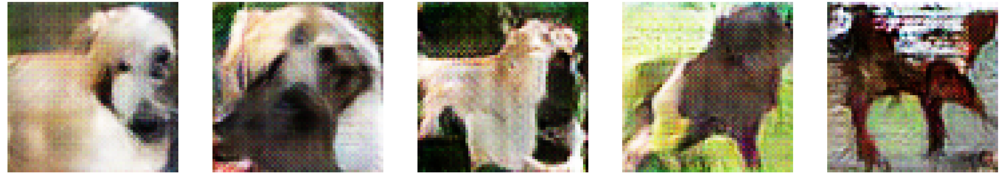

Epoch 100/100 
Duration: 36.82220 
D Loss: 0.42112 
G Loss: 1.68754


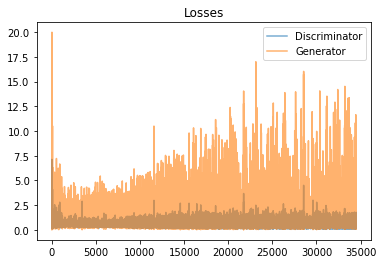

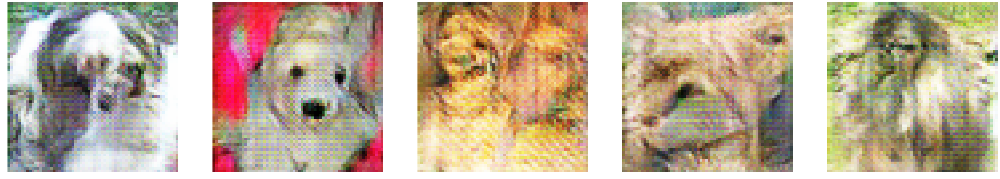

>> Generating 1k images ...


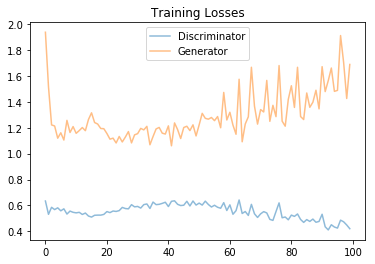

>> train time =  4096.158711194992


In [20]:
start = time.time()

print(">> Start training...")
with tf.Graph().as_default():
    train(get_batches(imagesIn), imagesIn.shape)
    
print(">> train time = ",time.time() - start)

<br>
# Generated Dogs

images =  10000


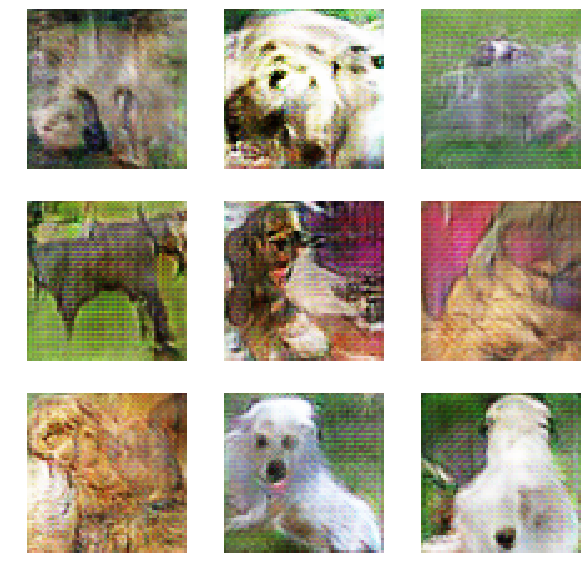

In [21]:
imgs = os.listdir('/kaggle/working/images')
print ("images = ",len(imgs))

plt.figure(figsize=(10,10))
for i,image in enumerate(imgs):
    im= Image.open('images/'+image)
    plt.subplot(3,3,i+1)
    plt.axis("off")
    plt.imshow(im)    
    if(i==8):
        break

In [22]:
shutil.make_archive('images', 'zip', 'images')
!ls

__notebook__.ipynb  __output__.json  images  images.zip  train_losses.png


**Generated images information**

In [23]:
imgs = os.listdir('/kaggle/working/images')
print ("images = ",len(imgs))

# read image
img = cv2.imread('/kaggle/working/images/'+imgs[0], cv2.IMREAD_UNCHANGED)
 
# get dimensions of image
dimensions = img.shape
 
# height, width, number of channels in image
height = img.shape[0]
width = img.shape[1]
channels = img.shape[2]
 
print('Image Dimension    : ',dimensions)
print('Image Height       : ',height)
print('Image Width        : ',width)
print('Number of Channels : ',channels)

images =  10000
Image Dimension    :  (64, 64, 3)
Image Height       :  64
Image Width        :  64
Number of Channels :  3


<br>
# LB Score

- You need to set ```ComputeLB = True``` and import the dataset [Dog face generation competition MiFID metric input
](https://www.kaggle.com/wendykan/dog-face-generation-competition-kid-metric-input) 

In [24]:
from __future__ import absolute_import, division, print_function
import numpy as np
import os
import gzip, pickle
import tensorflow as tf
from scipy import linalg
import pathlib
import urllib
import warnings
from tqdm import tqdm
from PIL import Image

class KernelEvalException(Exception):
    pass

model_params = {
    'Inception': {
        'name': 'Inception', 
        'imsize': 64,
        'output_layer': 'Pretrained_Net/pool_3:0', 
        'input_layer': 'Pretrained_Net/ExpandDims:0',
        'output_shape': 2048,
        'cosine_distance_eps': 0.1
        }
}

def create_model_graph(pth):
    """Creates a graph from saved GraphDef file."""
    # Creates graph from saved graph_def.pb.
    with tf.gfile.FastGFile( pth, 'rb') as f:
        graph_def = tf.GraphDef()
        graph_def.ParseFromString( f.read())
        _ = tf.import_graph_def( graph_def, name='Pretrained_Net')

def _get_model_layer(sess, model_name):
    # layername = 'Pretrained_Net/final_layer/Mean:0'
    layername = model_params[model_name]['output_layer']
    layer = sess.graph.get_tensor_by_name(layername)
    ops = layer.graph.get_operations()
    for op_idx, op in enumerate(ops):
        for o in op.outputs:
            shape = o.get_shape()
            if shape._dims != []:
              shape = [s.value for s in shape]
              new_shape = []
              for j, s in enumerate(shape):
                if s == 1 and j == 0:
                  new_shape.append(None)
                else:
                  new_shape.append(s)
              o.__dict__['_shape_val'] = tf.TensorShape(new_shape)
    return layer

def get_activations(images, sess, model_name, batch_size=50, verbose=False):
    """Calculates the activations of the pool_3 layer for all images.

    Params:
    -- images      : Numpy array of dimension (n_images, hi, wi, 3). The values
                     must lie between 0 and 256.
    -- sess        : current session
    -- batch_size  : the images numpy array is split into batches with batch size
                     batch_size. A reasonable batch size depends on the disposable hardware.
    -- verbose    : If set to True and parameter out_step is given, the number of calculated
                     batches is reported.
    Returns:
    -- A numpy array of dimension (num images, 2048) that contains the
       activations of the given tensor when feeding inception with the query tensor.
    """
    inception_layer = _get_model_layer(sess, model_name)
    n_images = images.shape[0]
    if batch_size > n_images:
        print("warning: batch size is bigger than the data size. setting batch size to data size")
        batch_size = n_images
    n_batches = n_images//batch_size + 1
    pred_arr = np.empty((n_images,model_params[model_name]['output_shape']))
    for i in tqdm(range(n_batches)):
        if verbose:
            print("\rPropagating batch %d/%d" % (i+1, n_batches), end="", flush=True)
        start = i*batch_size
        if start+batch_size < n_images:
            end = start+batch_size
        else:
            end = n_images
                    
        batch = images[start:end]
        pred = sess.run(inception_layer, {model_params[model_name]['input_layer']: batch})
        pred_arr[start:end] = pred.reshape(-1,model_params[model_name]['output_shape'])
    if verbose:
        print(" done")
    return pred_arr


# def calculate_memorization_distance(features1, features2):
#     neigh = NearestNeighbors(n_neighbors=1, algorithm='kd_tree', metric='euclidean')
#     neigh.fit(features2) 
#     d, _ = neigh.kneighbors(features1, return_distance=True)
#     print('d.shape=',d.shape)
#     return np.mean(d)

def normalize_rows(x: np.ndarray):
    """
    function that normalizes each row of the matrix x to have unit length.

    Args:
     ``x``: A numpy matrix of shape (n, m)

    Returns:
     ``x``: The normalized (by row) numpy matrix.
    """
    return np.nan_to_num(x/np.linalg.norm(x, ord=2, axis=1, keepdims=True))


def cosine_distance(features1, features2):
    # print('rows of zeros in features1 = ',sum(np.sum(features1, axis=1) == 0))
    # print('rows of zeros in features2 = ',sum(np.sum(features2, axis=1) == 0))
    features1_nozero = features1[np.sum(features1, axis=1) != 0]
    features2_nozero = features2[np.sum(features2, axis=1) != 0]
    norm_f1 = normalize_rows(features1_nozero)
    norm_f2 = normalize_rows(features2_nozero)

    d = 1.0-np.abs(np.matmul(norm_f1, norm_f2.T))
    print('d.shape=',d.shape)
    print('np.min(d, axis=1).shape=',np.min(d, axis=1).shape)
    mean_min_d = np.mean(np.min(d, axis=1))
    print('distance=',mean_min_d)
    return mean_min_d


def distance_thresholding(d, eps):
    if d < eps:
        return d
    else:
        return 1

def calculate_frechet_distance(mu1, sigma1, mu2, sigma2, eps=1e-6):
    """Numpy implementation of the Frechet Distance.
    The Frechet distance between two multivariate Gaussians X_1 ~ N(mu_1, C_1)
    and X_2 ~ N(mu_2, C_2) is
            d^2 = ||mu_1 - mu_2||^2 + Tr(C_1 + C_2 - 2*sqrt(C_1*C_2)).
            
    Stable version by Dougal J. Sutherland.

    Params:
    -- mu1 : Numpy array containing the activations of the pool_3 layer of the
             inception net ( like returned by the function 'get_predictions')
             for generated samples.
    -- mu2   : The sample mean over activations of the pool_3 layer, precalcualted
               on an representive data set.
    -- sigma1: The covariance matrix over activations of the pool_3 layer for
               generated samples.
    -- sigma2: The covariance matrix over activations of the pool_3 layer,
               precalcualted on an representive data set.

    Returns:
    --   : The Frechet Distance.
    """

    mu1 = np.atleast_1d(mu1)
    mu2 = np.atleast_1d(mu2)

    sigma1 = np.atleast_2d(sigma1)
    sigma2 = np.atleast_2d(sigma2)

    assert mu1.shape == mu2.shape, "Training and test mean vectors have different lengths"
    assert sigma1.shape == sigma2.shape, "Training and test covariances have different dimensions"

    diff = mu1 - mu2

    # product might be almost singular
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if not np.isfinite(covmean).all():
        msg = "fid calculation produces singular product; adding %s to diagonal of cov estimates" % eps
        warnings.warn(msg)
        offset = np.eye(sigma1.shape[0]) * eps
        # covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))
        covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))
    
    # numerical error might give slight imaginary component
    if np.iscomplexobj(covmean):
        if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
            m = np.max(np.abs(covmean.imag))
            raise ValueError("Imaginary component {}".format(m))
        covmean = covmean.real

    # covmean = tf.linalg.sqrtm(tf.linalg.matmul(sigma1,sigma2))

    print('covmean.shape=',covmean.shape)
    # tr_covmean = tf.linalg.trace(covmean)

    tr_covmean = np.trace(covmean)
    return diff.dot(diff) + np.trace(sigma1) + np.trace(sigma2) - 2 * tr_covmean
    # return diff.dot(diff) + tf.linalg.trace(sigma1) + tf.linalg.trace(sigma2) - 2 * tr_covmean
#-------------------------------------------------------------------------------


def calculate_activation_statistics(images, sess, model_name, batch_size=50, verbose=False):
    """Calculation of the statistics used by the FID.
    Params:
    -- images      : Numpy array of dimension (n_images, hi, wi, 3). The values
                     must lie between 0 and 255.
    -- sess        : current session
    -- batch_size  : the images numpy array is split into batches with batch size
                     batch_size. A reasonable batch size depends on the available hardware.
    -- verbose     : If set to True and parameter out_step is given, the number of calculated
                     batches is reported.
    Returns:
    -- mu    : The mean over samples of the activations of the pool_3 layer of
               the incption model.
    -- sigma : The covariance matrix of the activations of the pool_3 layer of
               the incption model.
    """
    act = get_activations(images, sess, model_name, batch_size, verbose)
    mu = np.mean(act, axis=0)
    sigma = np.cov(act, rowvar=False)
    return mu, sigma, act
    
def _handle_path_memorization(path, sess, model_name, is_checksize, is_check_png):
    path = pathlib.Path(path)
    files = list(path.glob('*.jpg')) + list(path.glob('*.png'))
    imsize = model_params[model_name]['imsize']

    # In production we don't resize input images. This is just for demo purpose. 
    x = np.array([np.array(img_read_checks(fn, imsize, is_checksize, imsize, is_check_png)) for fn in files])
    m, s, features = calculate_activation_statistics(x, sess, model_name)
    del x #clean up memory
    return m, s, features

# check for image size
def img_read_checks(filename, resize_to, is_checksize=False, check_imsize = 64, is_check_png = False):
    im = Image.open(str(filename))
    if is_checksize and im.size != (check_imsize,check_imsize):
        raise KernelEvalException('The images are not of size '+str(check_imsize))
    
    if is_check_png and im.format != 'PNG':
        raise KernelEvalException('Only PNG images should be submitted.')

    if resize_to is None:
        return im
    else:
        return im.resize((resize_to,resize_to),Image.ANTIALIAS)

def calculate_kid_given_paths(paths, model_name, model_path, feature_path=None):
    ''' Calculates the KID of two paths. '''
    tf.reset_default_graph()
    create_model_graph(str(model_path))
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        m1, s1, features1 = _handle_path_memorization(paths[0], sess, model_name, is_checksize = True, is_check_png = True)
        if feature_path is None:
            m2, s2, features2 = _handle_path_memorization(paths[1], sess, model_name, is_checksize = False, is_check_png = False)
        else:
            with np.load(feature_path) as f:
                m2, s2, features2 = f['m'], f['s'], f['features']

        print('m1,m2 shape=',(m1.shape,m2.shape),'s1,s2=',(s1.shape,s2.shape))
        print('starting calculating FID')
        fid_value = calculate_frechet_distance(m1, s1, m2, s2)
        print('done with FID, starting distance calculation')
        distance = cosine_distance(features1, features2)        
        return fid_value, distance

In [25]:
user_images_unzipped_path = '/kaggle/working/images/'
images_path = [user_images_unzipped_path,'../input/generative-dog-images/all-dogs/all-dogs/']
public_path = '../input/dog-face-generation-competition-kid-metric-input/classify_image_graph_def.pb'
fid_epsilon = 10e-15
fid_value_public, distance_public = calculate_kid_given_paths(images_path, 'Inception', public_path)
distance_public = distance_thresholding(distance_public, model_params['Inception']['cosine_distance_eps'])
print("FID_public: ", fid_value_public, "distance_public: ", distance_public, "multiplied_public: ", fid_value_public /(distance_public + fid_epsilon))

NotFoundError: ../input/dog-face-generation-competition-kid-metric-input/classify_image_graph_def.pb; No such file or directory

In [26]:
!rm -r images
!ls

__notebook__.ipynb  __output__.json  images.zip  train_losses.png
